# Práctica INFARTOS

In [2]:
from google.colab import drive 
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
from google.colab import data_table
data_table.enable_dataframe_formatter()

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 13})
from matplotlib import figure
import seaborn as sns

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix,classification_report,cohen_kappa_score, roc_curve, roc_auc_score

from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler, ClusterCentroids,TomekLinks
from sklearn.utils.class_weight import compute_class_weight

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier

In [143]:
! pip install plotnine

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [144]:
from plotnine import *

In [279]:
data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/datos_infarto.csv')


In [ ]:
data.drop(columns = ['ID'], inplace = True) #la variable ID no es representativa de cada individo por lo que la descartamos para el análisis.

Podemos ver que el valor 'Nunca ha trabajado' no es parte de los posibles valores de Tipo de Trabajo.

In [146]:
data['Tipo_Trabajo'].unique()

array(['Autonomo', 'Funcionario', 'Sector Privado', 'Menor'], dtype=object)

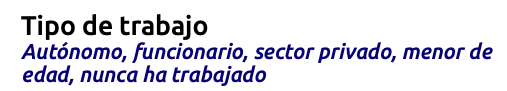

Podemos apreciar que el 30% de la muestra que tenemos para entrenar y testar el modelo ha preferido no compartir si es o no fumador. Aunque es simple de utilizar esa info en el modelo, y encontrar patrones sobre los individios que prefieren no contestar puede causar algun sesgo en su interpretación más adelante. 

In [147]:
data['Fumador'].unique()

array(['Fumo en el pasado', 'Nunca ha fumado', 'No Contesta', 'Fuma'],
      dtype=object)

In [148]:
round(len(data[(data['Fumador'] == 'No Contesta')])/len(data)*100,2)

30.1

In [149]:
data.isnull().sum()

Genero                 0
Tipo_Trabajo           0
Residencia_habitual    0
Casado                 0
Edad                   0
Hipertension           0
Enfermedad_Corazon     0
Fumador                0
Nivel_medio_glucosa    0
IMC                    0
Infarto                0
dtype: int64

Con la query anterior comprobamos si existen datos nulos en la muestra. En caso de existir datos nulos, en función de cuantos sean y como esten de repartidos poríamos eliminar dichas tuplas, si el dataset no se ve muy comprometido, o usar alguna tecnica para generar esos datos sin alterar sustancialmente el dataset

In [150]:
print("Tuplas duplicadas a eliminar en el dataset son {}".format(data.duplicated().sum()))

Tuplas duplicadas a eliminar en el dataset son 0


En el caso de que existieran tuplas identicas en el dataset deberíamos quedarnos unicamente con una representación de ellas.

In [151]:
data.loc[data['Fumador'] == 'No Contesta']['Edad'].round(0).value_counts().head(20)

2.0     88
5.0     63
1.0     62
8.0     56
3.0     46
9.0     38
13.0    36
7.0     32
4.0     32
14.0    28
12.0    26
78.0    25
18.0    25
6.0     24
11.0    24
10.0    24
17.0    23
37.0    23
19.0    22
16.0    22
Name: Edad, dtype: int64

In [152]:
data

,Genero,Tipo_Trabajo,Residencia_habitual,Casado,Edad,Hipertension,Enfermedad_Corazon,Fumador,Nivel_medio_glucosa,IMC,Infarto
0,Hombre,Autonomo,Ciudad,Si,80.0,0,1,Fumo en el pasado,252.72,30.5,1
1,Hombre,Funcionario,Ciudad,No,48.0,0,0,Nunca ha fumado,84.20,29.7,1
2,Mujer,Sector Privado,Rural,No,82.0,1,1,Fumo en el pasado,84.03,26.5,1
3,Hombre,Sector Privado,Rural,Si,74.0,0,0,Fumo en el pasado,219.72,33.7,1
4,Mujer,Sector Privado,Rural,Si,72.0,1,0,Fumo en el pasado,74.63,23.1,1
...,...,...,...,...,...,...,...,...,...,...,...
4979,Mujer,Sector Privado,Rural,Si,65.0,0,0,Fumo en el pasado,100.98,28.2,1
4980,Hombre,Autonomo,Ciudad,Si,69.0,0,1,Fuma,195.23,28.3,1
4981,Hombre,Sector Privado,Ciudad,Si,57.0,1,0,Fuma,212.08,44.2,1
4982,Hombre,Sector Privado,Rural,Si,42.0,0,0,No Contesta,83.41,25.4,1


In [237]:
len (data)

4984

## Análisis univariante

In [247]:
for column in data:
  if (data[column].dtypes != float):
    print('\033[1m {} \033[0m \n {} \n'.format(column,data[column].value_counts()))
  else:
    print('\033[1m {} \033[0m : {} - {}'.format(column,data[column].min(),data[column].max()))

 Genero  
 Mujer     2908
Hombre    2076
Name: Genero, dtype: int64 

 Tipo_Trabajo  
 Sector Privado    2858
Autonomo           805
Menor              673
Funcionario        648
Name: Tipo_Trabajo, dtype: int64 

 Residencia_habitual  
 Ciudad    2534
Rural     2450
Name: Residencia_habitual, dtype: int64 

 Casado  
 Si    3282
No    1702
Name: Casado, dtype: int64 

 Edad  : 0.08 - 82.0
 Hipertension  
 0    4505
1     479
Name: Hipertension, dtype: int64 

 Enfermedad_Corazon  
 0    4708
1     276
Name: Enfermedad_Corazon, dtype: int64 

 Fumador  
 Nunca ha fumado      1840
No Contesta          1500
Fumo en el pasado     868
Fuma                  776
Name: Fumador, dtype: int64 

 Nivel_medio_glucosa  : 55.12 - 271.74
 IMC  : 14.0 - 48.9
 Infarto  
 0    4734
1     250
Name: Infarto, dtype: int64 



In [248]:
def binary_to_yn(data):
 return pd.Series(np.where(data.values == 1, 'Si', 'No'),
          data.index,name = data.name)

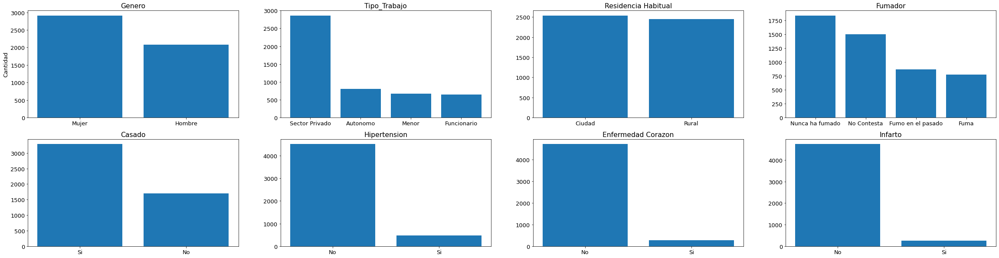

In [249]:
plt.figure(figsize=(40, 10))
plt.subplot(241)
plt.bar(data['Genero'].value_counts().index.tolist(), data['Genero'].value_counts().tolist())
plt.title('Genero')
plt.ylabel('Cantidad')
plt.subplot(242)
plt.bar(data['Tipo_Trabajo'].value_counts().index.tolist(), data['Tipo_Trabajo'].value_counts().tolist())
plt.title('Tipo_Trabajo')
plt.subplot(243)
plt.bar(data['Residencia_habitual'].value_counts().index.tolist(), data['Residencia_habitual'].value_counts().tolist())
plt.title('Residencia Habitual')
plt.subplot(244)
plt.bar(data['Fumador'].value_counts().index.tolist(), data['Fumador'].value_counts().tolist())
plt.title('Fumador')
plt.subplot(245)
plt.bar(data['Casado'].value_counts().index.tolist(), data['Casado'].value_counts().tolist())
plt.title('Casado')
plt.subplot(246)
plt.bar(binary_to_yn(data['Hipertension']).value_counts().index.tolist(), data['Hipertension'].value_counts().tolist())
plt.title('Hipertension')
plt.subplot(247)
plt.bar(binary_to_yn(data['Enfermedad_Corazon']).value_counts().index.tolist(), data['Enfermedad_Corazon'].value_counts().tolist())
plt.title('Enfermedad Corazon')
plt.subplot(248)
plt.bar(binary_to_yn(data['Infarto']).value_counts().index.tolist(), data['Infarto'].value_counts().tolist())
plt.title('Infarto')

plt.show()

Text(0.5, 1.0, 'Infarto')

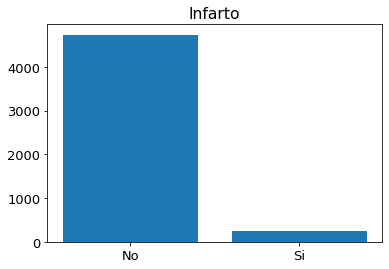

In [250]:
plt.bar(binary_to_yn(data['Infarto']).value_counts().index.tolist(), data['Infarto'].value_counts().tolist())
plt.title('Infarto')

El análisis univarienate demuestra que las variables nominales o binarias están en su mayoria no balanceadas, exxceptuando la residencia habitual. Vemos casos extremos con la hipertensión, las enfermedades de corazon y la variable a predecir, el número de infartos.

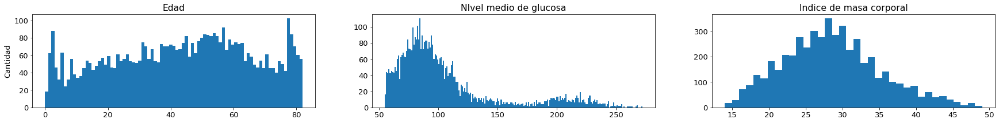

In [251]:
edad_redondeada = data['Edad'].round(0)
nmg_redondeado = data['Nivel_medio_glucosa'].round(0)
imc_redondeado = data['IMC'].round(0)

plt.figure(figsize=(30, 3))
plt.subplot(131)
plt.hist(edad_redondeada, bins = int(edad_redondeada.max() - edad_redondeada.min() + 1))
plt.title('Edad')
plt.ylabel('Cantidad')
plt.subplot(132)
plt.hist(nmg_redondeado, bins = int(nmg_redondeado.max() - nmg_redondeado.min() + 1))
plt.title('NIvel medio de glucosa')
plt.subplot(133)
a,b,c = plt.hist(imc_redondeado, bins = int(imc_redondeado.max() - imc_redondeado.min() + 1))
plt.title('Indice de masa corporal')
plt.show()



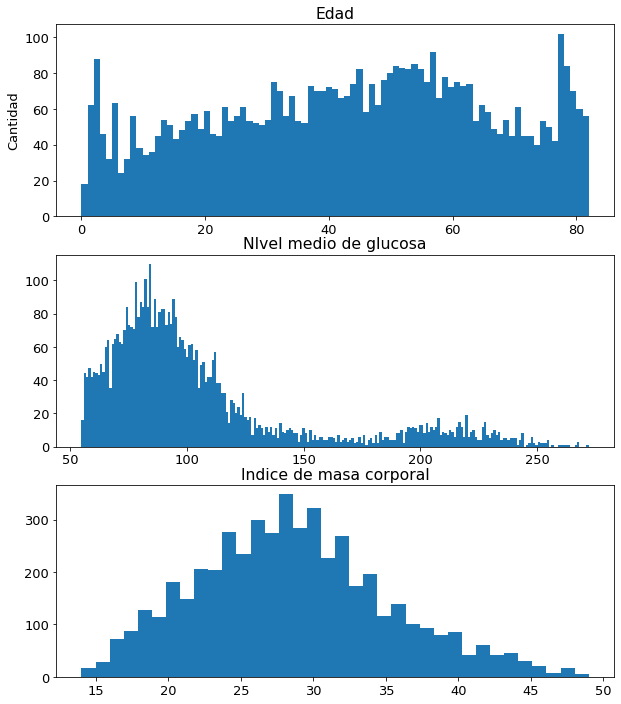

In [252]:
plt.figure(figsize=(10, 12))
plt.subplot(311)
plt.hist(edad_redondeada, bins = int(edad_redondeada.max() - edad_redondeada.min() + 1))
plt.title('Edad')
plt.ylabel('Cantidad')
plt.subplot(312)
plt.hist(nmg_redondeado, bins = int(nmg_redondeado.max() - nmg_redondeado.min() + 1))
plt.title('NIvel medio de glucosa')
plt.subplot(313)
a,b,c = plt.hist(imc_redondeado, bins = int(imc_redondeado.max() - imc_redondeado.min() + 1))
plt.title('Indice de masa corporal')
plt.show()


Podemos apreciar que aunque la distribución de edades es bastante similar existen dos algunos casos en los que se disparan las muestras.

In [253]:
edad_redondeada.value_counts().head(10)

78.0    102
57.0     92
2.0      88
54.0     85
51.0     84
79.0     84
52.0     83
45.0     82
53.0     82
55.0     82
Name: Edad, dtype: int64

ya que la media de apariciones año a año es de 60 aprox

In [254]:
edad_redondeada.value_counts().mean()

60.04819277108434

En los histogramas vemos diferencias claras. El Índice de masa corporal podemos ver que se podria asemejar a una distribución normal, ligeramente desviada, mientras que el nivel medio de glucosa tiene en su mayoría niveles bajos. 

## Análisis Multivariante 


In [255]:
def multivariant(x,x_values,total):
  exceptions = ['Hipertension','Enfermedad_Corazon']
  plt.figure(figsize=(10, 5)) 
  if x in exceptions:
   sns.histplot(binwidth=1,x=x,hue='Infarto',data=pd.concat([binary_to_yn(data[x]),data['Infarto']],axis = 1),stat="count",multiple="dodge")
  else:
   sns.histplot(binwidth=1,x=x,hue='Infarto',data=data[[x,'Infarto']],stat="count",multiple="dodge")
  plt.show()
  a = []
  b = []
  for value in x_values:
    a.append(round(len(data[(data[x]==value)])/total * 100,2))
    b.append(round(len(data[(data[x]==value) & (data['Infarto']== 1)])/ len(data[(data[x]==value)])*100,2))
  result = pd.DataFrame(list(zip(x_values,a,b)),columns=['variable','Proporcion','Propocion con infarto'])
  print(result.to_string(index = False)) 
  print('')

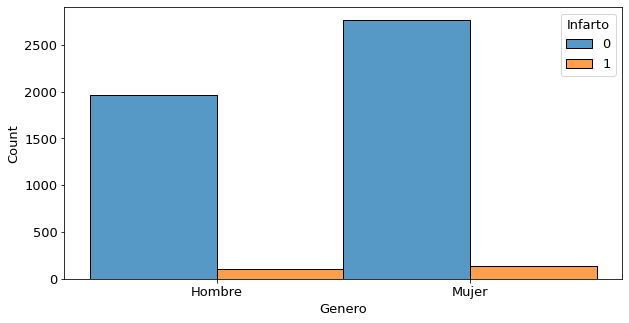

variable  Proporcion  Propocion con infarto
  Hombre       41.65                   5.25
   Mujer       58.35                   4.85



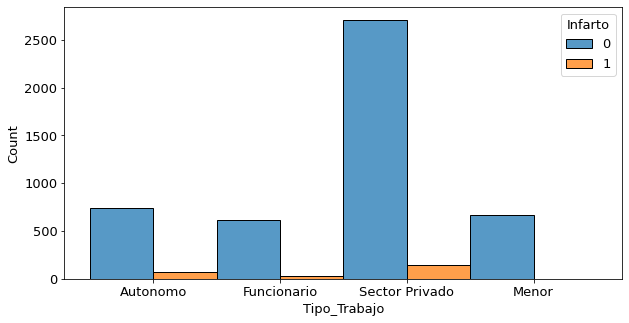

      variable  Proporcion  Propocion con infarto
      Autonomo       16.15                   8.20
   Funcionario       13.00                   5.09
Sector Privado       57.34                   5.21
         Menor       13.50                   0.30



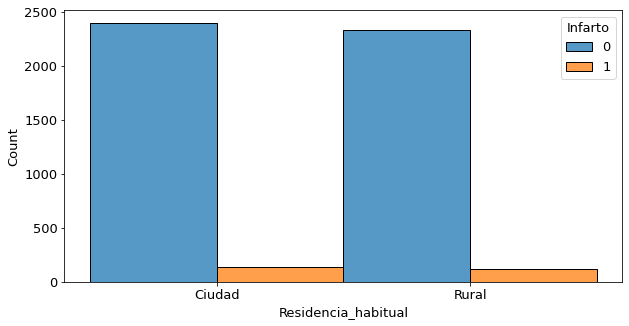

variable  Proporcion  Propocion con infarto
  Ciudad       50.84                   5.37
   Rural       49.16                   4.65



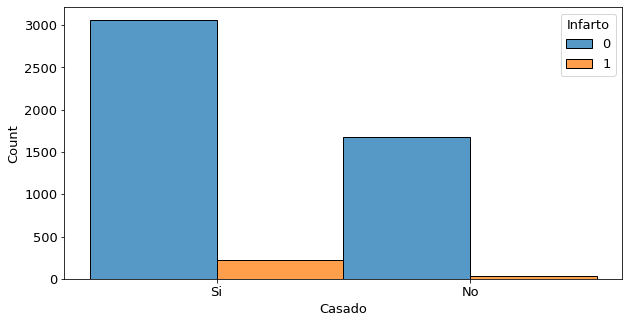

variable  Proporcion  Propocion con infarto
      Si       65.85                   6.70
      No       34.15                   1.76



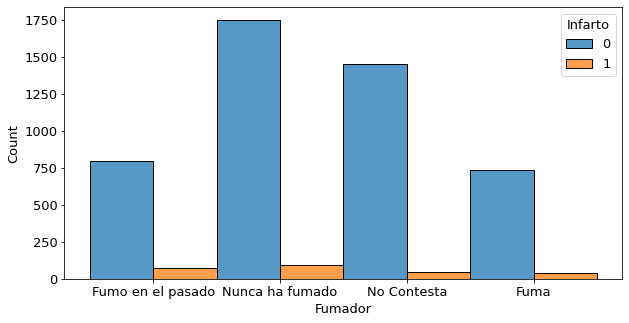

         variable  Proporcion  Propocion con infarto
Fumo en el pasado       17.42                   8.18
  Nunca ha fumado       36.92                   4.89
      No Contesta       30.10                   3.13
             Fuma       15.57                   5.41



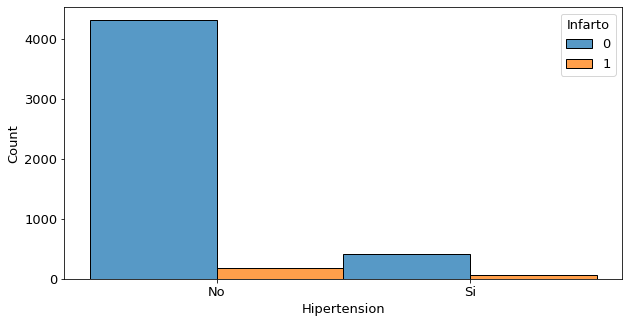

 variable  Proporcion  Propocion con infarto
        0       90.39                   4.08
        1        9.61                  13.78



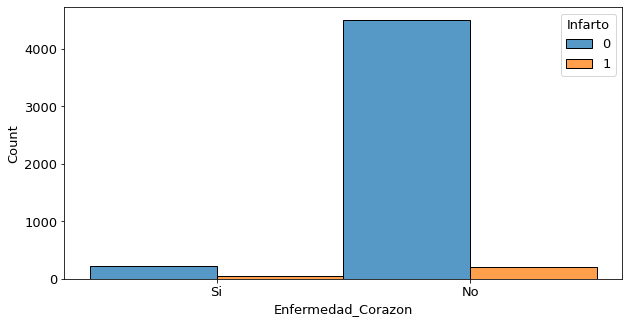

 variable  Proporcion  Propocion con infarto
        1        5.54                  17.39
        0       94.46                   4.29



In [256]:
binary_columns = ['Genero','Tipo_Trabajo','Residencia_habitual','Casado','Fumador','Hipertension', 'Enfermedad_Corazon' ]
for col in binary_columns:
 multivariant(col,data[col].unique(),len(data))


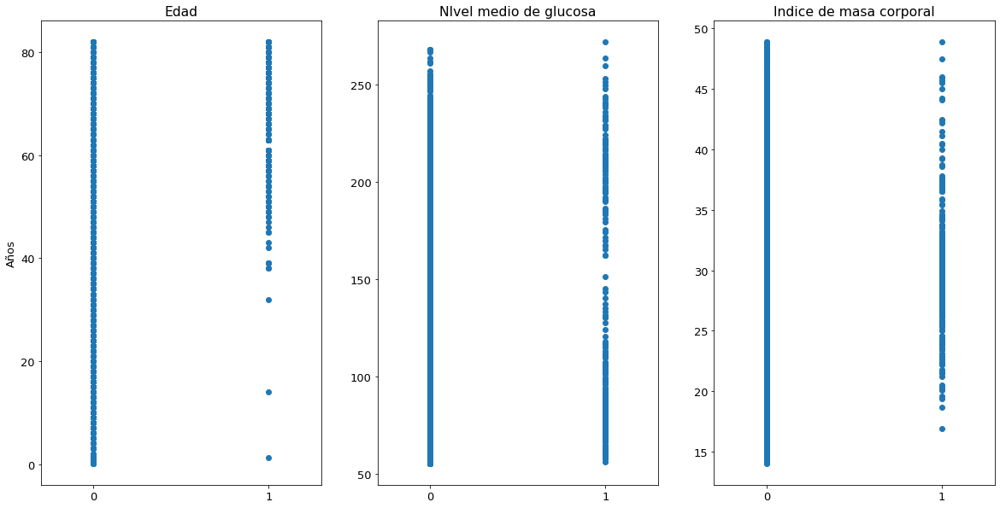

In [257]:
plt.figure(figsize=(20,10))
plt.subplot(131)
plt.scatter(x = data[['Infarto']].to_numpy(), y = data[['Edad']].to_numpy())
plt.xticks([0,1])
plt.xlim(-0.3, 1.3)
plt.title('Edad')
plt.ylabel('Años')
plt.subplot(132)
plt.scatter(x = data[['Infarto']].to_numpy(), y = data[['Nivel_medio_glucosa']].to_numpy())
plt.xticks([0,1])
plt.xlim(-0.3, 1.3)
plt.title('NIvel medio de glucosa')
plt.subplot(133)
plt.scatter(x = data[['Infarto']].to_numpy(), y = data[['IMC']].to_numpy())
plt.xticks([0,1])
plt.xlim(-0.3, 1.3)
plt.title('Indice de masa corporal')
plt.show()

Con esta imagen podemos apreciar que la posibilidad de tener un infarto esta altamente determinada con la edad del paciente, aunque se dan algunos casos la mayoría de infartos se concentran en gente de alta edad. De hecho este cruce de variables se puede realizar con un boxplot para ver de manera mas grafica los datos y outiers. 

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


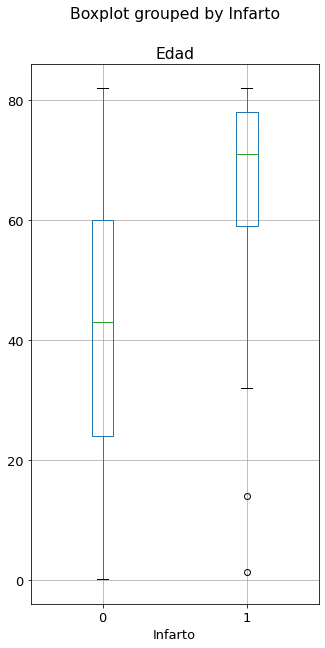

In [258]:
data.boxplot(column = 'Edad',by = 'Infarto', figsize = (5,10)) 

Este mismo análisis lo podemos hacer para nivel de glucosa y IMC 

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))
/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


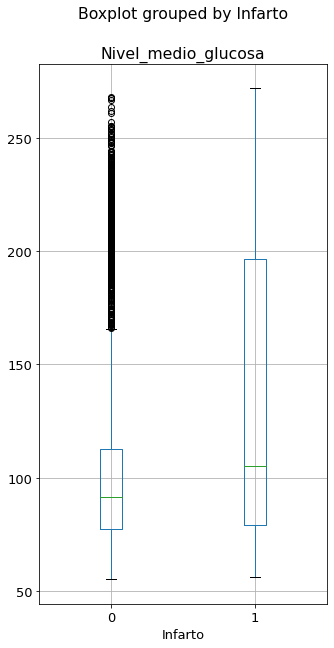

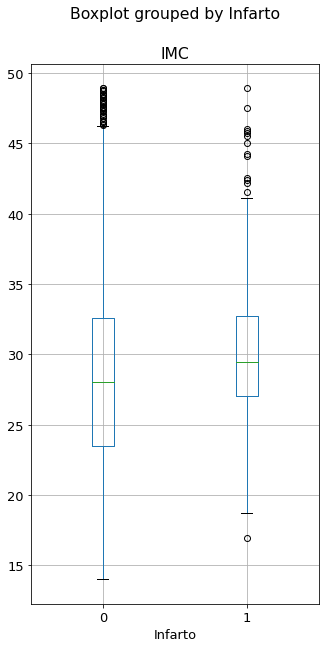

In [259]:
columns = ['Nivel_medio_glucosa','IMC']
for column in columns:
   data.boxplot(column = [column],by = 'Infarto', figsize = (5,10)) 

Aunque esta fuera del scope de esta practica se podrían eliminar ciertas tuplas en cuanto a las tres variables ya que son consideradas para la muestra outliers. El caso de la glucosa no parece que descartar esos outliers sea una buena idea ya que es posible que los algoritmos a entrenar posteriormente consideren que nsiempre se va a tener un infarto si el valor medio de la glucosa esta por encima de 170 ya que hay muchos casos que se harían drop.

In [260]:
def correlation_heatmap(corr):
  f, ax = plt.subplots(figsize=(12, 10))
  mask = np.triu(np.ones_like(corr, dtype=bool))
  cmap = sns.diverging_palette(230, 20, as_cmap=True)
  sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

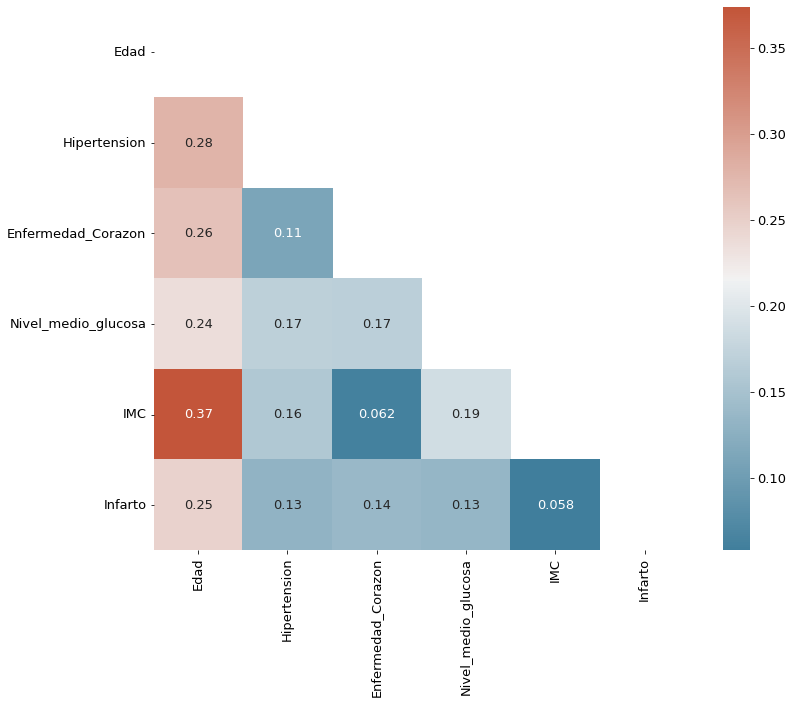

In [261]:
correlation_heatmap(data.corr())

## Division de datos


In [25]:
train_size = 0.8
test_size = 1 - train_size
data_lenght = len(data)

indices = np.random.permutation(data_lenght)
train_random_size = int(data_lenght*train_size)

train_selection = indices[0:train_random_size]
test_selection = indices[train_random_size:]

train_data = data.iloc[train_selection]
test_data = data.iloc[test_selection]



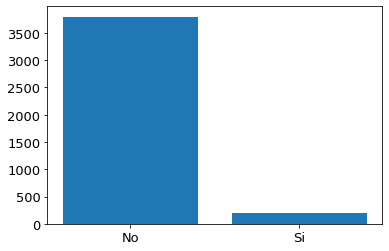

<BarContainer object of 2 artists>

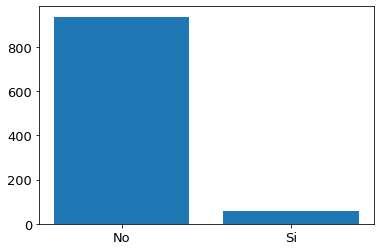

In [33]:
plt.bar(binary_to_yn(train_data['Infarto']).value_counts().index.tolist(), train_data['Infarto'].value_counts().tolist())
plt.show
plt.bar(binary_to_yn(test_data['Infarto']).value_counts().index.tolist(), test_data['Infarto'].value_counts().tolist())

In [39]:
print('Set original : Infartos -> {} \n Train set: Infartos -> {} \n Test set: Infartos -> {}'.format(len(data.loc[data['Infarto'] == 1])/len(data),
                                                                                                      len(train_data.loc[train_data['Infarto'] == 1])/len(train_data),
                                                                                                      len(test_data.loc[test_data['Infarto'] == 1])/len(test_data)))

Set original : Infartos -> 0.05016051364365971 
 Train set: Infartos -> 0.04790569350388763 
 Test set: Infartos -> 0.05917753259779338


Podemos comprobar que tenemos un buen split de los datos ya que se han mantenido los porcentajes relativos de las clases de infartos

In [49]:
train_data.reset_index(drop = True, inplace = True)
test_data.reset_index(drop = True, inplace = True)


In [53]:
train_data.to_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/train_dataset_raw.csv')
test_data.to_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/test_dataset_raw.csv')

## PreProcesado y entrenamiento. Regresion Logística


In [262]:
# Cargamos de nuevo los dato
train_data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/train_dataset_raw.csv',index_col=False)
test_data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/test_dataset_raw.csv',index_col=False)
train_data.drop(columns = ['Unnamed: 0'], inplace = True)
test_data.drop(columns = ['Unnamed: 0'], inplace = True)

In [263]:
results_matrix = pd.DataFrame(columns = ['Nombre','Modelo','Accuracy','Precision','Recall','F1-Score','kappa','auc_score','ConfusioMatrix','Classification Report','roc_curve'])
def conf_visualization(confusion_matrix):
  plt.figure(figsize = (8, 5))
  sns.heatmap(confusion_matrix, cmap = 'Blues', annot = True, fmt = 'd', linewidths = 5, cbar = False, 
            yticklabels = ['No Infarto', 'Infarto'], xticklabels = ['P. no Infarto', 'P. Infarto'])
  plt.yticks(rotation = 0)
  plt.show()

def model_evaluation_and_store(name,model,Y_test,X_test,save = True):
  Y_pred = model.predict(X_test)
  confusion = confusion_matrix(Y_test,Y_pred)
  classifi = classification_report(Y_test,Y_pred)
  acc = accuracy_score(Y_test,Y_pred)
  prec = precision_score(Y_test,Y_pred)
  rec = recall_score(Y_test,Y_pred) 
  f1 = f1_score(Y_test,Y_pred)
  kappa = cohen_kappa_score(Y_test,Y_pred)
  auc=roc_auc_score(Y_test, model.predict_proba(X_test)[:,1], multi_class='ovr')
  roc = roc_curve(Y_test, model.predict_proba(X_test)[:,1], pos_label=1)

  print('Matriz de confusion')
  conf_visualization(confusion)
  print('Clasification report')
  print(classifi)
  print('Accuracy: {}'.format(acc))
  print('Precision: {}'.format(prec))
  print('Recall: {}'.format(rec))
  print('F1 Score: {}'.format(f1))
  print('Kappa: {}'.format(kappa))
  print('AUROC: {}'.format(auc))
  print('')

  if save:
    if(len(results_matrix.loc[results_matrix['Nombre']==name])==0):
      results_matrix.loc[len(results_matrix)] = [name,model,acc,prec,rec,f1,kappa,auc,confusion,classifi,roc]
      print('Modelo {} almacenado en matriz de resultados'.format(name))
    else: print('No se almacena este resulta porque YA EXISTE ')

In [264]:
train_data['Edad'] = train_data['Edad'].round()
test_data['Edad'] = test_data['Edad'].round()

No existen diferencias significativas entre una persona recien naciada y una persona de 0,18 años (2 meses y algo mayor) y aunque vayamos posteriormente a normalizar las variables entre maximo y mínimo es oportuno redondear a la unidad primero para posiblemente mejorar los resultados. Normalizar -> Solo para el caso del regresor logístico 

In [265]:
def tranform_cat_variables(data):  
  OneHot = ColumnTransformer(transformers= [('encoder', OneHotEncoder(), [0,1,2,7])], remainder= 'passthrough')
  Label = LabelEncoder()
  x = np.array(OneHot.fit_transform(data.to_numpy()))
  x[:,12] = Label.fit_transform(x[:,12])
  return pd.DataFrame(x,columns = ['Hombre','Mujer','Autonomo','Funcionario','Menor','Privado','Ciudad','Rural','Nunca_ha_fumado','Fuma','Fumo_pasado','No_contesta','Casado','Edad','Hipertension','Enfermedad_Corazon','Nivel_medio_glucosa','IMC','Infarto'])

In [266]:
train_data = tranform_cat_variables(train_data)
test_data = tranform_cat_variables(test_data)

In [267]:
train_data

,Hombre,Mujer,Autonomo,Funcionario,Menor,Privado,Ciudad,Rural,Nunca_ha_fumado,Fuma,Fumo_pasado,No_contesta,Casado,Edad,Hipertension,Enfermedad_Corazon,Nivel_medio_glucosa,IMC,Infarto
0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,19.0,0,0,74.86,28.4,0
1,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0,35.0,0,0,93.6,28.5,0
2,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1,80.0,1,1,86.68,27.7,0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,16.0,0,0,82.44,32.6,0
4,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,36.0,0,0,96.1,29.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3982,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,26.0,0,0,108.2,26.2,0
3983,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1,58.0,0,0,59.86,28.0,1
3984,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1,80.0,0,0,62.62,23.1,0
3985,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,67.0,0,0,68.52,26.2,0


In [30]:
max = train_data.max()
min = train_data.min()

In [31]:
for column_name in ['Edad','Nivel_medio_glucosa','IMC']:
    train_data[column_name] = (train_data[column_name]-min[column_name])/(max[column_name] - min[column_name])
    test_data[column_name] = (test_data[column_name]-min[column_name])/(max[column_name] - min[column_name])
    train_data[column_name] = train_data[column_name].astype(float).round(4)
    test_data[column_name] = test_data[column_name].astype(float).round(4)

In [32]:
LR = LogisticRegression()

In [33]:
X = train_data[train_data.columns[:-1]].to_numpy()
Y = train_data[train_data.columns[-1]].astype('int').to_numpy()

In [34]:
X_test = test_data[test_data.columns[:-1]].to_numpy()
Y_test = test_data[test_data.columns[-1]].astype('int').to_numpy()

In [35]:
LR.fit(X,Y)

LogisticRegression()

Matriz de confusion


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classificat

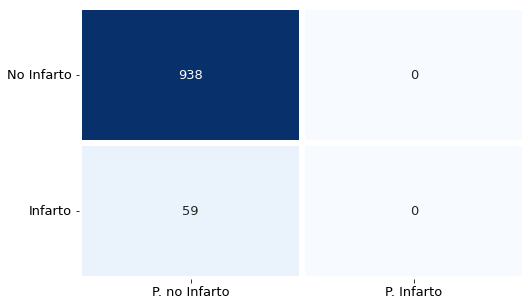

Clasification report
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       938
           1       0.00      0.00      0.00        59

    accuracy                           0.94       997
   macro avg       0.47      0.50      0.48       997
weighted avg       0.89      0.94      0.91       997

Accuracy: 0.9408224674022067
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
Kappa: 0.0
AUROC: 0.8345921723103611

Modelo SimpleLR almacenado en matriz de resultados


In [36]:
model_evaluation_and_store('SimpleLR',LR,Y_test,X_test)

Podemos apreciar que devido a la falta de balanceo de las clases el algotitmo ha aprendido a predecir siempre la clase no infarto , ya que al ser la mayoria de instancias de este tipo el accuracy es bueno. 

Matriz de confusion


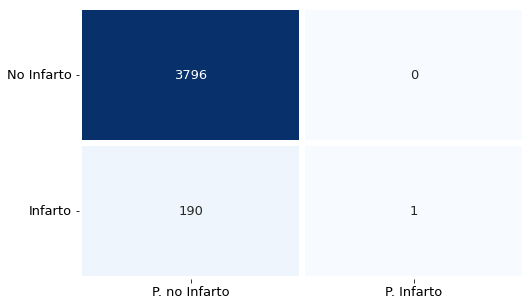

Clasification report
              precision    recall  f1-score   support

           0       0.95      1.00      0.98      3796
           1       1.00      0.01      0.01       191

    accuracy                           0.95      3987
   macro avg       0.98      0.50      0.49      3987
weighted avg       0.95      0.95      0.93      3987

Accuracy: 0.9523451216453473
Precision: 1.0
Recall: 0.005235602094240838
F1 Score: 0.010416666666666668
Kappa: 0.009922600578731289
AUROC: 0.8498005616272847



In [37]:
model_evaluation_and_store('SimpleLR',LR,Y,X,False)

Vamos que si le pasamos incluso los datos con los cuales ha entrenado apenas una única instancia de las de infarto las clasifica correctamente 

Existen muchas **posibles soluciones** a este problema. Tres que vamos a explorar son:
- **Balancear** el entrenamiento ajustando los pesos de importancia que da el modelo a cada una de las clases a predecir. De esta forma el modelo 'balancea' el conociemiento adquierido al entrenar sobre la clase mayoritari y minoritaria. 
- Realizar un **Oversampling** de los datos de entrenamiento creando nuevas tuplas de la calse minoritaria para igualar el número de tuplas que entran de cada clase. 
- Realizar un **Undersampling** de los datos de entrenamiento igualando la frecuencia relativa de tuplas a la de la clase menos representada

**BALANCEO**

Para balancear vamos a usar una funcionalidad ya incorporada en la clase de LogisticRegression de Sklearn denominada class_weights.

Matriz de confusion


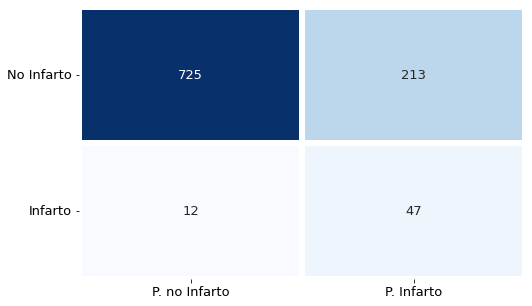

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.87       938
           1       0.18      0.80      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.78      0.58       997
weighted avg       0.94      0.77      0.83       997

Accuracy: 0.7743229689067201
Precision: 0.18076923076923077
Recall: 0.7966101694915254
F1 Score: 0.2946708463949843
Kappa: 0.21936714190762208
AUROC: 0.8317191283292978

Modelo LR_balanced almacenado en matriz de resultados


In [38]:
LR_balanced = LR = LogisticRegression( class_weight= 'balanced')
LR_balanced.fit(X,Y)
model_evaluation_and_store('LR_balanced',LR_balanced,Y_test,X_test)

La implementación automática de balanceo, balancea las clases inversamente proporcional a la freciencia de estas bajo la fórmula. 

W[Infarto] = n_instancias_totales/(n_clases * n_instancias[Infarto])

W[No Infarto] = n_instancias_totales/(n_clases * n_instancias[No Infarto])

Vemos que el accuracy del modelo baja con respecto al no balanceado pero es un mejor modelo ya que es capaz de predecir del conjunto de test (59 infartos) es capaz de predecir 47 de ellos. Esto no llega con níngun inconveniente sino que ahora además el modelo predice 213 casos de no infarto como infarto. 



In [41]:
samples = len(train_data)
n_classes = 2
samples_infarto = len(train_data[(train_data['Infarto']==1)])
samples_no_infarto = len(train_data[(train_data['Infarto']==0)])
weight_infarto = samples/(n_classes*samples_infarto)
weight_no_infarto = samples/(n_classes*samples_no_infarto)

In [42]:
print('Los cálculos darían unos pesos de {} para Infartos y {} para No Infartos'.format(weight_infarto,weight_no_infarto))

Los cálculos darían unos pesos de 10.43717277486911 para Infartos y 0.5251580611169653 para No Infartos


Vamos a confirmar con la librería sklearn que son los pesos utilizados 

In [43]:
compute_class_weight(class_weight = 'balanced',classes = [0,1], y = Y)

array([ 0.52515806, 10.43717277])

In [45]:
proporcion = weight_infarto / weight_no_infarto
print(proporcion)

19.874345549738216


La llamada a Logistic Regresion nos permite balancear los pesos como deseemos. Si probamos un balanceo ligeramente más fuerta hacia los infartos vamos a apreciar que el modelo va a empeorar ya que van a realizarse más falsos positivos entendidos como mas casos de Predicción de Infarto cuando en realidad es no infarto.

Matriz de confusion


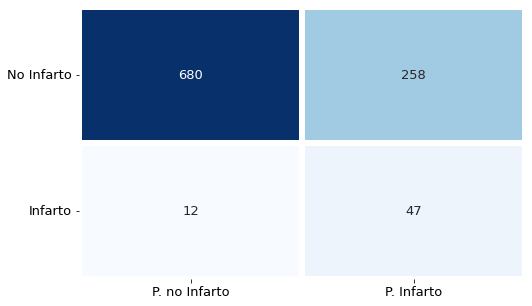

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.72      0.83       938
           1       0.15      0.80      0.26        59

    accuracy                           0.73       997
   macro avg       0.57      0.76      0.55       997
weighted avg       0.93      0.73      0.80       997

Accuracy: 0.7291875626880642
Precision: 0.1540983606557377
Recall: 0.7966101694915254
F1 Score: 0.2582417582417582
Kappa: 0.17658250692834299
AUROC: 0.830815655379278

Modelo LR_custom_balanced almacenado en matriz de resultados


In [46]:
LR_custom_balanced = LR = LogisticRegression( class_weight= {0: 0.4,1: 11})
LR_custom_balanced.fit(X,Y)
model_evaluation_and_store('LR_custom_balanced',LR_custom_balanced,Y_test,X_test)

Otra de las posibilidades, como en todo los modelos de aprendizaje autómático, es realizar proceso de **optimización sobre los hiperparámetros**, en este caso, pesos del modelo. Sklearn te permite hacer una busqueda exhaustiva con la función **grid search** dados el modelos a optimizar y una serie de pesos a probar. Además, para ello es necesario dar una forma de selección del mejor modelo. En este caso seleccionamos el F1 Score como parámetro a optimizar en la selección.

In [47]:
weights = np.linspace(0.00, 0.99, 200)
gsc = GridSearchCV(estimator=LogisticRegression(),param_grid={ 'class_weight': [{0: x, 1: 1.0-x} for x in weights]},scoring='f1',cv=3)
grid_result = gsc.fit(X, Y)
print("Los mejores parámetro encontrados son: {} para No Infartos y {} para Infartos".format(grid_result.best_params_['class_weight'][0],grid_result.best_params_['class_weight'][1]))


Los mejores parámetro encontrados son: 0.08954773869346734 para No Infartos y 0.9104522613065327 para Infartos


Matriz de confusion


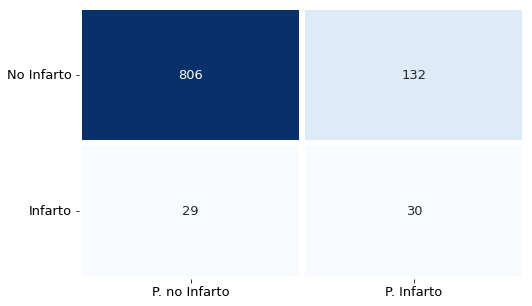

Clasification report
              precision    recall  f1-score   support

           0       0.97      0.86      0.91       938
           1       0.19      0.51      0.27        59

    accuracy                           0.84       997
   macro avg       0.58      0.68      0.59       997
weighted avg       0.92      0.84      0.87       997

Accuracy: 0.8385155466399198
Precision: 0.18518518518518517
Recall: 0.5084745762711864
F1 Score: 0.2714932126696833
Kappa: 0.20228504977114714
AUROC: 0.8279426113982147

Modelo LR_gridsearch_balanced almacenado en matriz de resultados


In [48]:
LR_gridsearch_balanced = LR = LogisticRegression( class_weight= {0: grid_result.best_params_['class_weight'][0],1: grid_result.best_params_['class_weight'][1]})
LR_gridsearch_balanced.fit(X,Y)
model_evaluation_and_store('LR_gridsearch_balanced',LR_gridsearch_balanced,Y_test,X_test)

El f1 score encontrado para los parátros de busqueda es menor que el caso de balanceado. 0,271 frente a 0,294. Este segundo modelo ha mejorado el accuracy total ya que precide mejor los casos de no infarto pero algo peor los de infarto. Es importante saber el contexto sobre el cual se usa el modelo. En caso de usar el modelo para asignar recursos para vigilar más de cerca a aquellos pacientes clasificados como infarto, es mejor que el modelo prediga mejor los reales infartos y se equivoque un poco clasificando falsos positivos. En cambio, si queremos el modelo para testar una nueva medicina que reduce el posible infarto pero con posibles efectos secundarios es posible que sea mejor el segundo. Entender los riesgos del contexto nos puede ayudar a elegir un modelo para producción de una manera más correcta. 

**Oversampling**

La segunda técnica para solventar el problema es la generación de nuevas tuplas hasta igual la cantidad total con la clase más representada. Como es lógico se pueden establecer muchas formas de generación de esas nuevas tuplas.  La más sencilla es duplicar las tuplas con las que cuenta el dataset de manera que aprenda más sobre ellas. Otras técnicas mas complejas se basan en clusterización para poder generar nuevas tuplas artificiales con sentido.

In [50]:
randomsampler = RandomOverSampler(sampling_strategy='minority')
X_randomover, Y_randomover = randomsampler.fit_resample(X, Y)

Matriz de confusion


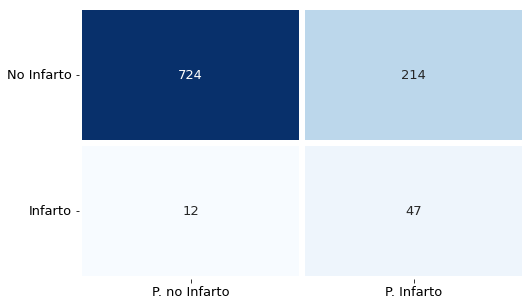

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.18      0.80      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.78      0.58       997
weighted avg       0.94      0.77      0.83       997

Accuracy: 0.7733199598796389
Precision: 0.18007662835249041
Recall: 0.7966101694915254
F1 Score: 0.29375
Kappa: 0.21828879899528864
AUROC: 0.8326768096563189

Modelo LR_randomover almacenado en matriz de resultados


In [51]:
LR_randomover = LogisticRegression()
LR_randomover.fit(X_randomover,Y_randomover)
model_evaluation_and_store('LR_randomover',LR_randomover,Y_test,X_test)

En el caso del algritmo SMOTE - Synthetic Minority Over-sampling Technique tenemos un parámetrro que optimizar que es el número de kneigbors o grupos en los cuales se divide la clase con menos instancias y sobre los cuales se generan nuevas tuplas. Este algorimo usa otro embebido que es el knearest-kneihbors para poder generar esas tuplas. Vamos a buscar el mejor nñumeor de grupos de 2 a 10.

In [53]:
for i in range(0,3):
  print('¡aaaaa{}'.format(i))

¡aaaaa0
¡aaaaa1
¡aaaaa2


Matriz de confusion


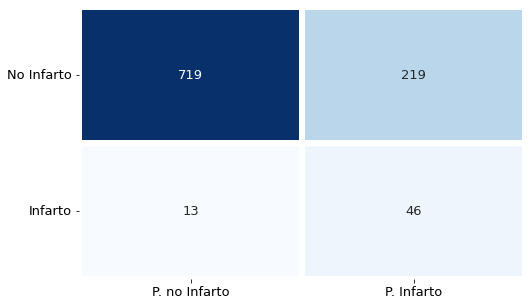

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.78      0.28        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7673019057171514
Precision: 0.17358490566037735
Recall: 0.7796610169491526
F1 Score: 0.2839506172839506
Kappa: 0.20720597207274527
AUROC: 0.8346283112283618

Modelo LR_smote_k_2 almacenado en matriz de resultados
Matriz de confusion


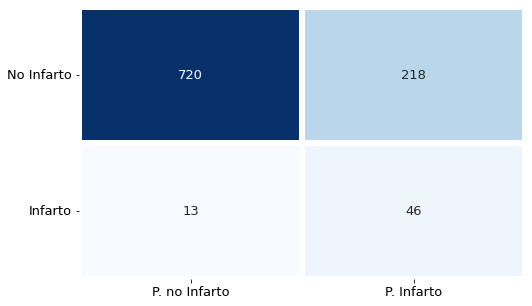

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.78      0.28        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7683049147442327
Precision: 0.17424242424242425
Recall: 0.7796610169491526
F1 Score: 0.2848297213622291
Kappa: 0.2082377895963614
AUROC: 0.8320985869683062

Modelo LR_smote_k_3 almacenado en matriz de resultados
Matriz de confusion


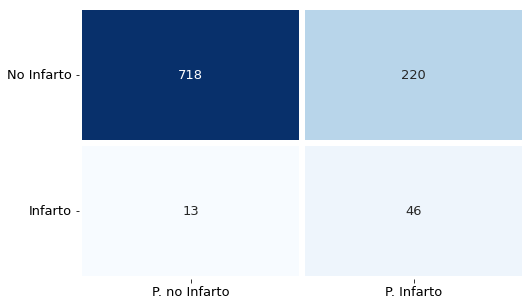

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.78      0.28        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7662988966900702
Precision: 0.17293233082706766
Recall: 0.7796610169491526
F1 Score: 0.28307692307692306
Kappa: 0.20618035313374583
AUROC: 0.8302735716092661

Modelo LR_smote_k_4 almacenado en matriz de resultados
Matriz de confusion


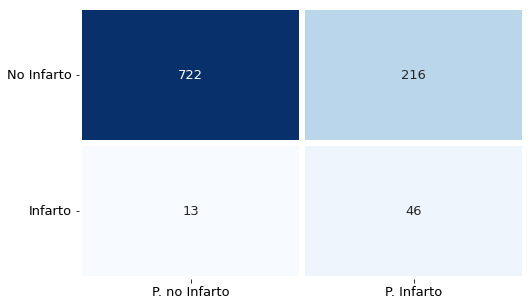

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.18      0.78      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7703109327983951
Precision: 0.17557251908396945
Recall: 0.7796610169491526
F1 Score: 0.28660436137071654
Kappa: 0.21032024654037584
AUROC: 0.8313577391492899

Modelo LR_smote_k_5 almacenado en matriz de resultados
Matriz de confusion


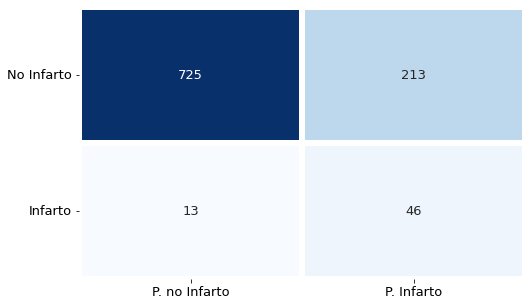

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.87       938
           1       0.18      0.78      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.78      0.58       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7733199598796389
Precision: 0.1776061776061776
Recall: 0.7796610169491526
F1 Score: 0.289308176100629
Kappa: 0.21349185294815765
AUROC: 0.8322431426403094

Modelo LR_smote_k_6 almacenado en matriz de resultados
Matriz de confusion


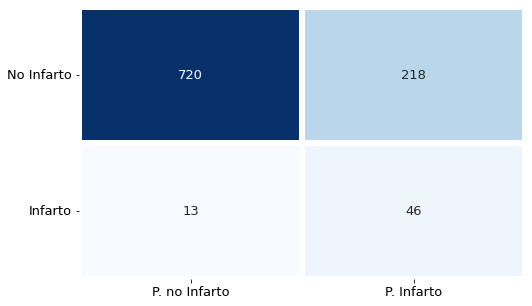

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.78      0.28        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7683049147442327
Precision: 0.17424242424242425
Recall: 0.7796610169491526
F1 Score: 0.2848297213622291
Kappa: 0.2082377895963614
AUROC: 0.8321166564273066

Modelo LR_smote_k_7 almacenado en matriz de resultados
Matriz de confusion


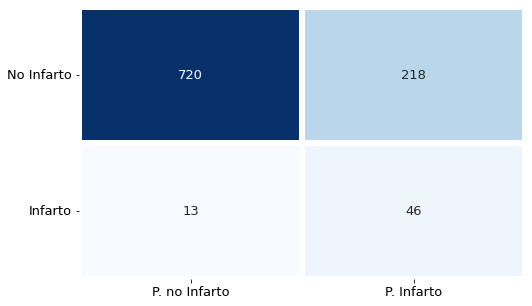

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.78      0.28        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7683049147442327
Precision: 0.17424242424242425
Recall: 0.7796610169491526
F1 Score: 0.2848297213622291
Kappa: 0.2082377895963614
AUROC: 0.8329478515413249

Modelo LR_smote_k_8 almacenado en matriz de resultados
Matriz de confusion


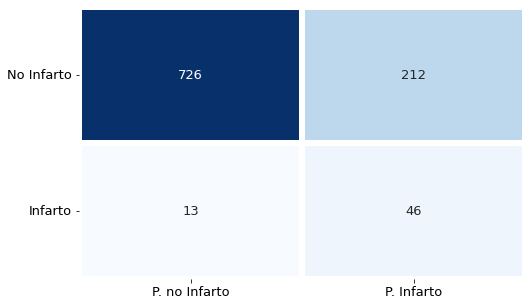

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.87       938
           1       0.18      0.78      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.78      0.58       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.7743229689067201
Precision: 0.17829457364341086
Recall: 0.7796610169491526
F1 Score: 0.2902208201892745
Kappa: 0.21456206999177185
AUROC: 0.8320805175093058

Modelo LR_smote_k_9 almacenado en matriz de resultados
Matriz de confusion


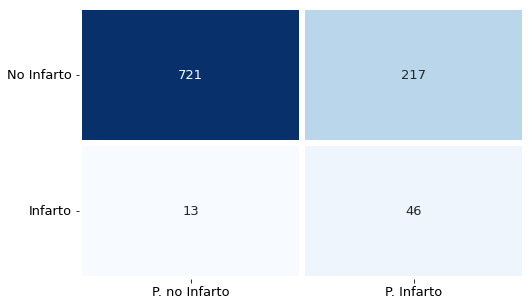

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.78      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.769307923771314
Precision: 0.17490494296577946
Recall: 0.7796610169491526
F1 Score: 0.2857142857142857
Kappa: 0.20927586206896542
AUROC: 0.8333273101803331

Modelo LR_smote_k_10 almacenado en matriz de resultados


In [54]:
smote_n = []
for i in range(2,11):
  smote_n.append(SMOTE(sampling_strategy='minority', k_neighbors = i))
  X_smoteover, Y_smoteover = smote_n[i-2].fit_resample(X, Y)
  LR_smote = LogisticRegression()
  LR_smote.fit(X_smoteover,Y_smoteover)
  model_evaluation_and_store('LR_smote_k_{}'.format(i),LR_smote,Y_test,X_test)

Podemos apreciar que el número de neighbors no es un atributo que producza diferencias significativas. De hecho al haber algo de aleatoriedad en la generación de tuplas una vez creados los grupos cada vez que ejecutamos podemos encontrar resultados muy ligeramente diferentes. En el caso de la ultima ejecución escogeríamos k_neighbors = 9. Todo ellos clasifican de la misma manera los infartos pero este de 9 vecinos es el que menos se equivoca pronosticando infartos sobre pacientes catalogados con no infartos obteniendo así la mejor precision y f1 score.

**Undersampling**

Otras de las posibilidades es reducir la clase prioritaria con un algoritmo de undersampling. Aunque **no es una solución acertada en este caso** debido a que el dataset con el que contamos es bastante reducido por añadir valor al trabajo se va a realizar la prueba. Al igual que en el oversampling existen muchos algoritmos para realizar esta selección en este trabajo vamos a utilizar dos: Random y ...

In [55]:
randomundersampler = RandomUnderSampler(sampling_strategy='majority')
X_randomunder, Y_randomunder = randomundersampler.fit_resample(X, Y)

In [56]:
print('El tamaño de la muestra ha pasado de {} a {}'.format(len(X),len(X_randomunder)))

El tamaño de la muestra ha pasado de 3987 a 382


Matriz de confusion


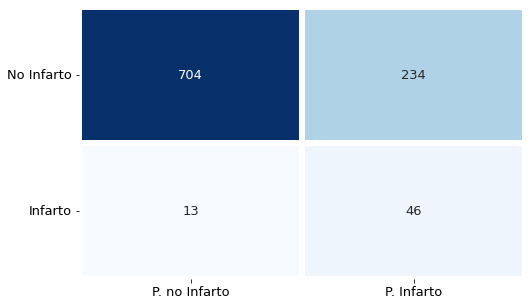

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.75      0.85       938
           1       0.16      0.78      0.27        59

    accuracy                           0.75       997
   macro avg       0.57      0.77      0.56       997
weighted avg       0.93      0.75      0.82       997

Accuracy: 0.7522567703109327
Precision: 0.16428571428571428
Recall: 0.7796610169491526
F1 Score: 0.2713864306784661
Kappa: 0.19244252204510337
AUROC: 0.8222868707310903

Modelo LR_randomunder almacenado en matriz de resultados


In [57]:
LR_randomunder = LogisticRegression()
LR_randomunder.fit(X_randomunder,Y_randomunder)
model_evaluation_and_store('LR_randomunder',LR_randomunder,Y_test,X_test)

In [58]:
clustercentroidsundersampler = ClusterCentroids(sampling_strategy='majority')
X_centroidsunder, Y_centroidsunder = clustercentroidsundersampler.fit_resample(X, Y)

Matriz de confusion


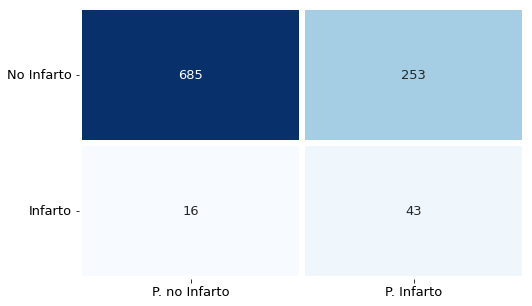

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       938
           1       0.15      0.73      0.24        59

    accuracy                           0.73       997
   macro avg       0.56      0.73      0.54       997
weighted avg       0.93      0.73      0.80       997

Accuracy: 0.7301905717151455
Precision: 0.14527027027027026
Recall: 0.7288135593220338
F1 Score: 0.24225352112676052
Kappa: 0.1592880407013011
AUROC: 0.8054461349427198

Modelo LR_centroidsunder almacenado en matriz de resultados


In [59]:
LR_centroidsunder = LogisticRegression()
LR_centroidsunder.fit(X_centroidsunder,Y_centroidsunder)
model_evaluation_and_store('LR_centroidsunder',LR_centroidsunder,Y_test,X_test)

Como era de esperar el modelo se comporta de una peor manera para catalogar la clase No Infarto que es aquella sobre la que se ha realizado el undersampling aunque los resultados son mejores de lo esperado. Si recordamos los resultados obtenidos con el modelo sin modificar las clases, realizar un subsampling es mucho mejor que no hacerlo.

**Soluciones mixtas**

Ahora se va a probar a solventar el problema de las clases no balanceadas mezclando el approach de oversampling y undersampling con el balanceo. De tal formar que cada técnica cubra la mitad del problema a solucionar. Todos los modelos utilizados permiten setear el "Sampling startegy" a un valor de proporción entre clase mayormente representada y menor por lo que setearemos este valor a 0.5 y el resto será balanceado por el LogisticRegressor

Matriz de confusion


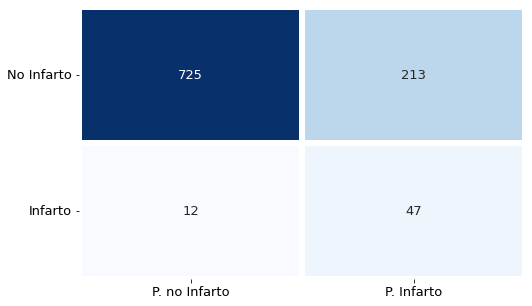

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.87       938
           1       0.18      0.80      0.29        59

    accuracy                           0.77       997
   macro avg       0.58      0.78      0.58       997
weighted avg       0.94      0.77      0.83       997

Accuracy: 0.7743229689067201
Precision: 0.18076923076923077
Recall: 0.7966101694915254
F1 Score: 0.2946708463949843
Kappa: 0.21936714190762208
AUROC: 0.8318998229193018

Modelo LR_geldedsmote_balanced almacenado en matriz de resultados


In [60]:
sampling_percentage = 0.5
gelded_smote = SMOTE(sampling_strategy=sampling_percentage, k_neighbors = 9)
X_geldedsmote, Y_geldedsmote = gelded_smote.fit_resample(X, Y)

LR_geldedsmote_balanced = LogisticRegression(class_weight= 'balanced')
LR_geldedsmote_balanced.fit(X_geldedsmote,Y_geldedsmote)
model_evaluation_and_store('LR_geldedsmote_balanced',LR_geldedsmote_balanced,Y_test,X_test)

El modelo mezclado es muy ligeramente superor al mismo modelo sin estar apoyado con el balanceo. La precisión ha mejorado con 3 casos mejorando el F1 Score del modelo.

Matriz de confusion


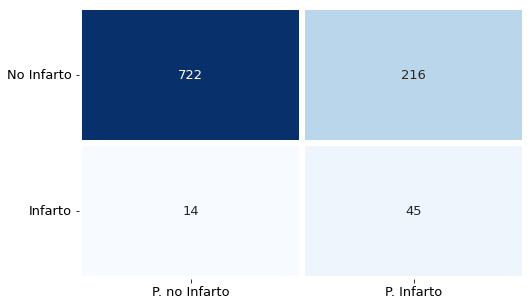

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.86       938
           1       0.17      0.76      0.28        59

    accuracy                           0.77       997
   macro avg       0.58      0.77      0.57       997
weighted avg       0.93      0.77      0.83       997

Accuracy: 0.769307923771314
Precision: 0.1724137931034483
Recall: 0.7627118644067796
F1 Score: 0.28125
Kappa: 0.20445320251732924
AUROC: 0.8226663293700986

Modelo LR_geldedrandomunder_balanced almacenado en matriz de resultados


In [61]:
gelded_randomundersampler = RandomUnderSampler(sampling_strategy=sampling_percentage)
X_geldedrandomunder, Y_geldedrandomunder = gelded_randomundersampler.fit_resample(X, Y)

LR_geldedrandomunder_balanced = LogisticRegression(class_weight= 'balanced')
LR_geldedrandomunder_balanced.fit(X_geldedrandomunder,Y_geldedrandomunder)
model_evaluation_and_store('LR_geldedrandomunder_balanced',LR_geldedrandomunder_balanced,Y_test,X_test)

La mezcla de undersampling y balanceo tambien mejora el mejor caso de undersampling solo

## Preprocesado y entrenamiento Arboles

En esta parte del estudio vamos a utilizar arboles para predecir los infartos entre los pacientes. Para ello vamos a realizar un prepocesado diferente de los datos.

In [268]:
train_data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/train_dataset_raw.csv',index_col=False)
test_data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/test_dataset_raw.csv',index_col=False)
train_data.drop(columns = ['Unnamed: 0'], inplace = True)
test_data.drop(columns = ['Unnamed: 0'], inplace = True)

Se van a discretizar los valores continuos para evaluar su implicación sobre la clasificación del modelo para ello vamos a hacer uso de una inspección visual de un análisis bivariante conocido como ViolinPlots. Estos gráficos nos ayudan a visualizar los datos en función de dos variables además añadiendo una dimensión de cantidad en el propio eje x. Esto nos permite hacer un custom fit de los rangos sobre los que vamos a discretizar.

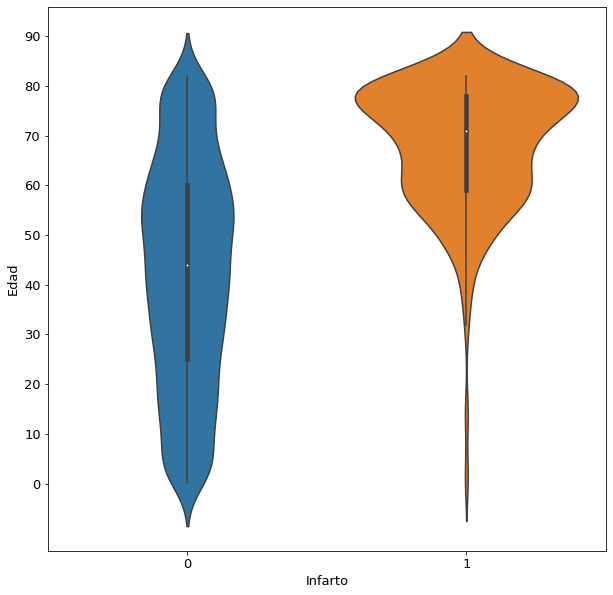

In [64]:
plt.figure(figsize=(10,10))
sns.violinplot(x = 'Infarto', y = 'Edad', data = train_data)
plt.yticks(ticks = [0,10,20,30,40,50,60,70,80,90])
plt.show()


El caso de la edad frente al infarto es muy representativo de esta forma discretización. Podemos apreciar que existe un rango de población desde 70 en adelante donde la muestra de la población tiene un número alto de casos de infarto. A partir de esta parte la figura se vuelve a estrechar hasta los 45 años creando otro conjunto [45,70], finalmente podemos apreciar que casi no hay casos de infartos en población menor a esa edad. Podriamos unir toda esa población en el rango [0,45] o hacer dos diferentes ya que la edad con otras variables como fumador pueden estar relacionadas. **Se escoge los conjuntos [0,18]; (18,45]; (45,70]; (70,adelante]**.

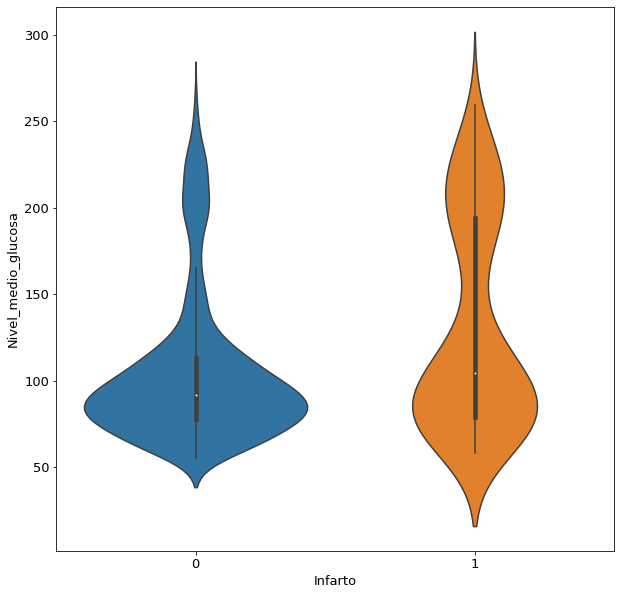

In [65]:
plt.figure(figsize=(10,10))
sns.violinplot(x = 'Infarto', y = 'Nivel_medio_glucosa', data = train_data)
plt.show()


Para el **Nivel medio de glucosa en sangre** además de una exploración visual hacemos un poco de uso de contexto medico y seteamos los rangos en: **[0,120]; (120,180]; (180,en adelante]**

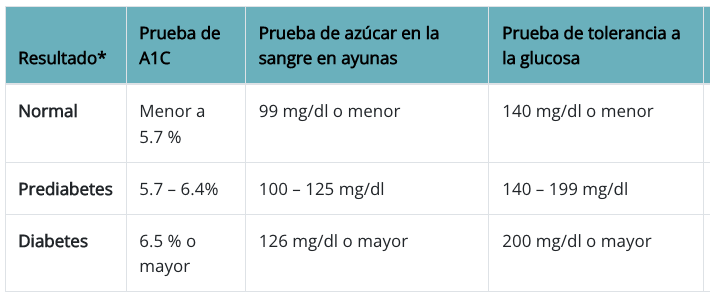

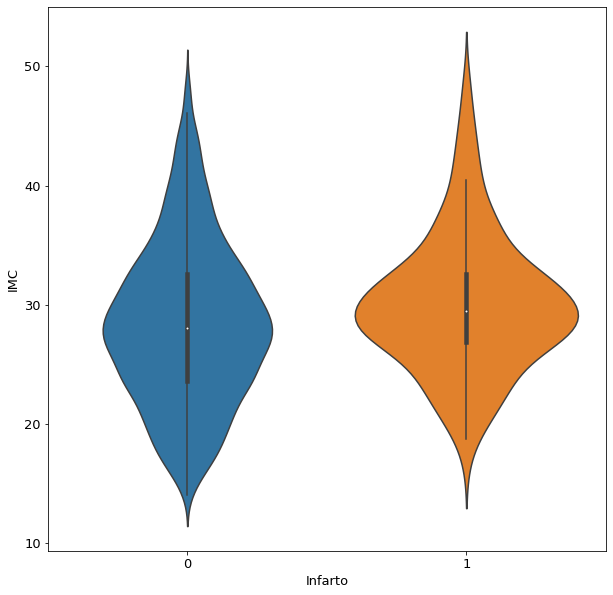

In [66]:
plt.figure(figsize=(10,10))
sns.violinplot(x = 'Infarto', y = 'IMC', data = train_data)
plt.show()

Para el caso de **IMC**, al igual que antes, usamos la exploración visual y nos ayudamos de los rangos definidos por sanidad ya que podemos ver una interrelación bastante buena.

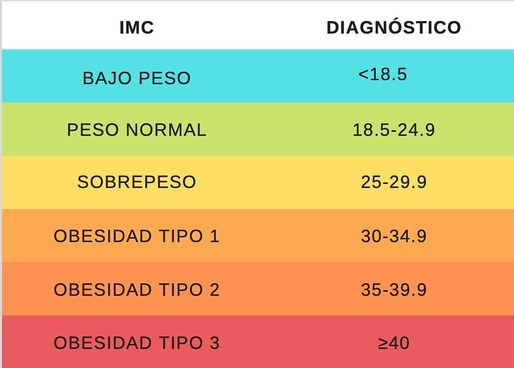

En este caso no necesitaos los 6 rangos interpuestos debido a que no va a favorecer el análisis sino que nos quedamos con 3 rangos:

**[0,24]; (24,35]; (35, en adelante]**

In [269]:
def tranform_cat_variables(data):  
  OneHot = ColumnTransformer(transformers= [('encoder', OneHotEncoder(), [0,1,2,7])], remainder= 'passthrough')
  Label = LabelEncoder()
  x = np.array(OneHot.fit_transform(data.to_numpy()))
  x[:,12] = Label.fit_transform(x[:,12])
  df = pd.DataFrame(x,columns = ['Hombre','Mujer','Autonomo','Funcionario','Menor','Privado','Ciudad','Rural','Nunca_ha_fumado','Fuma','Fumo_pasado','No_contesta','Casado','Edad','Hipertension','Enfermedad_Corazon','Nivel_medio_glucosa','IMC','Infarto'])
  df.drop(columns = ['Mujer','Rural'], inplace = True)
  return df

In [270]:
train_data = tranform_cat_variables(train_data)
test_data = tranform_cat_variables(test_data)
train_data_discretized = train_data.copy()
test_data_discretized = test_data.copy()

In [271]:
def edad_condition(x):
  if x <= 18: return 0
  elif x <= 45: return 1
  elif x <= 70: return 2
  else: return 3

def ngs_condition(x):
  if x <= 120: return 0
  elif x <= 180: return 1
  else: return 2

def imc_confition(x):
  if x <= 24: return 0
  elif x <= 35: return 1
  else: return 2

In [273]:
train_data

,Hombre,Autonomo,Funcionario,Menor,Privado,Ciudad,Nunca_ha_fumado,Fuma,Fumo_pasado,No_contesta,Casado,Edad,Hipertension,Enfermedad_Corazon,Nivel_medio_glucosa,IMC,Infarto
0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0,19.0,0,0,74.86,28.4,0
1,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0,35.0,0,0,93.6,28.5,0
2,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1,80.0,1,1,86.68,27.7,0
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,16.0,0,0,82.44,32.6,0
4,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0,36.0,0,0,96.1,29.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3982,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0,26.0,0,0,108.2,26.2,0
3983,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1,58.0,0,0,59.86,28.0,1
3984,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1,80.0,0,0,62.62,23.1,0
3985,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1,67.0,0,0,68.52,26.2,0


In [272]:
train_data_discretized['Edad'] = train_data_discretized['Edad'].apply(edad_condition)
train_data_discretized['Nivel_medio_glucosa'] = train_data_discretized['Nivel_medio_glucosa'].apply(ngs_condition)
train_data_discretized['IMC'] = train_data_discretized['IMC'].apply(imc_confition)

test_data_discretized['Edad'] = test_data_discretized['Edad'].apply(edad_condition)
test_data_discretized['Nivel_medio_glucosa'] = test_data_discretized['Nivel_medio_glucosa'].apply(ngs_condition)
test_data_discretized['IMC'] = test_data_discretized['IMC'].apply(imc_confition)

In [71]:
train_data=train_data.astype('int')
test_data=test_data.astype('int')
train_data_discretized=train_data_discretized.astype('int')
test_data_discretized=test_data_discretized.astype('int')

In [72]:
X = train_data[train_data.columns[:-1]].to_numpy()
Y = train_data[train_data.columns[-1]].astype('int').to_numpy()
X_discretized = train_data_discretized[train_data_discretized.columns[:-1]].to_numpy()

In [73]:
X_test = test_data[test_data.columns[:-1]].to_numpy()
Y_test = test_data[test_data.columns[-1]].astype('int').to_numpy()
X_discretized_test = test_data_discretized[test_data_discretized.columns[:-1]].to_numpy()

In [74]:
tree = DecisionTreeClassifier(criterion = 'gini')
tree_discretized = DecisionTreeClassifier(criterion = 'gini')
tree.fit(X,Y)
tree_discretized.fit(X_discretized,Y)

DecisionTreeClassifier()

Matriz de confusion


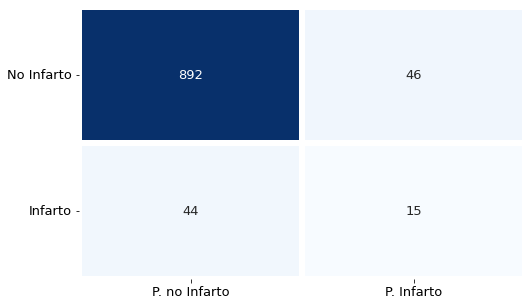

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       938
           1       0.25      0.25      0.25        59

    accuracy                           0.91       997
   macro avg       0.60      0.60      0.60       997
weighted avg       0.91      0.91      0.91       997

Accuracy: 0.9097291875626881
Precision: 0.2459016393442623
Recall: 0.2542372881355932
F1 Score: 0.24999999999999994
Kappa: 0.20198858077942405
AUROC: 0.6025983882042572

Modelo SimpleTree almacenado en matriz de resultados
Matriz de confusion


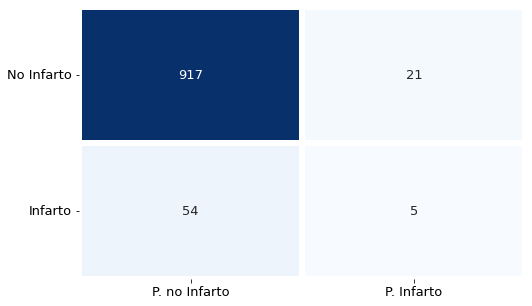

Clasification report
              precision    recall  f1-score   support

           0       0.94      0.98      0.96       938
           1       0.19      0.08      0.12        59

    accuracy                           0.92       997
   macro avg       0.57      0.53      0.54       997
weighted avg       0.90      0.92      0.91       997

Accuracy: 0.9247743229689067
Precision: 0.19230769230769232
Recall: 0.0847457627118644
F1 Score: 0.11764705882352942
Kappa: 0.08450359342287295
AUROC: 0.6031766108922698

Modelo SimpleTree_discretized almacenado en matriz de resultados


In [75]:
model_evaluation_and_store('SimpleTree',tree,Y_test,X_test)
model_evaluation_and_store('SimpleTree_discretized',tree_discretized,Y_test,X_discretized_test)

In [76]:
print('La profundidad del arbol con los datos sin discretizar {} mientras que el arbol con los datos discretizados {}'.format(tree.tree_.max_depth,tree_discretized.tree_.max_depth))

La profundidad del arbol con los datos sin discretizar 19 mientras que el arbol con los datos discretizados 16


El arbol con los datos sin descretizar es mas complejo ya que crea mas nodos para poder separa la relación entre las variables contuinuas y la probabilidad de pertencer a la clase infarto. En cambio, el arbol sin discretizar vamos que resuelva el problema con una profundida maxima menor pero perdiendo accuracy sobre la clase infarto = 1. El arbol entrenado con la clase sin discretizar tiene un mayor F1 por lo que es mejor para utilizar en el modelo.

Matriz de confusion


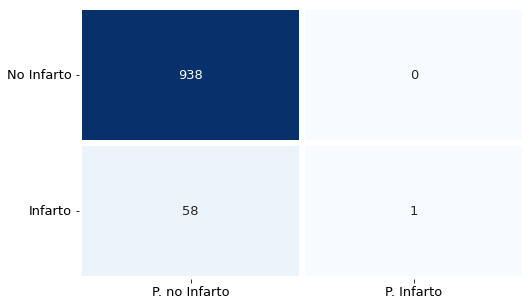

Clasification report
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       938
           1       1.00      0.02      0.03        59

    accuracy                           0.94       997
   macro avg       0.97      0.51      0.50       997
weighted avg       0.95      0.94      0.91       997

Accuracy: 0.9418254764292878
Precision: 1.0
Recall: 0.01694915254237288
F1 Score: 0.03333333333333333
Kappa: 0.031422732906770334
AUROC: 0.7709153987929602

Modelo SimpleRF almacenado en matriz de resultados


In [77]:
rf = RandomForestClassifier(n_estimators= 20, criterion = 'gini')
rf.fit(X,Y)
model_evaluation_and_store('SimpleRF',rf,Y_test,X_test)

Matriz de confusion


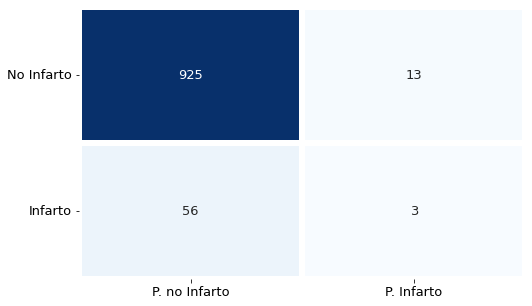

Clasification report
              precision    recall  f1-score   support

           0       0.94      0.99      0.96       938
           1       0.19      0.05      0.08        59

    accuracy                           0.93       997
   macro avg       0.57      0.52      0.52       997
weighted avg       0.90      0.93      0.91       997

Accuracy: 0.9307923771313942
Precision: 0.1875
Recall: 0.05084745762711865
F1 Score: 0.08
Kappa: 0.05616913852950456
AUROC: 0.6705576235047523

Modelo rf_discretized almacenado en matriz de resultados


In [78]:
rf_discretized = RandomForestClassifier(n_estimators= 20, criterion = 'gini')
rf_discretized.fit(X_discretized,Y)
model_evaluation_and_store('rf_discretized',rf_discretized,Y_test,X_discretized_test)

En cambio el random forest prefiere los datos discretizados para mejorar el output.

De momento hemos realizado pruebas de como prefieren estos arboles que se le presente el dato. Vemos que cada uno parece tener mejores resultados con cada dataset. Para las siguientes pruebas se van a mantener los datasets por separado y realizar balanceo, oversampling y undersampling para volver a entrenarlos. Además ambos aprecen tener mejores resultados con el criterio gini que con la entropía, despues de una bateria de pruebas realizadas con ambos.

In [80]:
results_matrix.iloc[:,:-3]

,Nombre,Modelo,Accuracy,Precision,Recall,F1-Score,kappa,auc_score
0,SimpleLR,LogisticRegression(),0.940822,0.000000,0.000000,0.000000,0.000000,0.834592
1,LR_balanced,LogisticRegression(class_weight='balanced'),0.774323,0.180769,0.796610,0.294671,0.219367,0.831719
2,LR_custom_balanced,"LogisticRegression(class_weight={0: 0.4, 1: 11})",0.729188,0.154098,0.796610,0.258242,0.176583,0.830816
3,LR_gridsearch_balanced,LogisticRegression(class_weight={0: 0.08954773...,0.838516,0.185185,0.508475,0.271493,0.202285,0.827943
4,LR_randomover,LogisticRegression(),0.773320,0.180077,0.796610,0.293750,0.218289,0.832677
5,LR_smote_k_2,LogisticRegression(),0.767302,0.173585,0.779661,0.283951,0.207206,0.834628
6,LR_smote_k_3,LogisticRegression(),0.768305,0.174242,0.779661,0.284830,0.208238,0.832099
7,LR_smote_k_4,LogisticRegression(),0.766299,0.172932,0.779661,0.283077,0.206180,0.830274
8,LR_smote_k_5,LogisticRegression(),0.770311,0.175573,0.779661,0.286604,0.210320,0.831358
9,LR_smote_k_6,LogisticRegression(),0.773320,0.177606,0.779661,0.289308,0.213492,0.832243


**Balanceo** 

In [81]:
tree_balanced = DecisionTreeClassifier(criterion = 'gini',class_weight = 'balanced')
tree_balanced.fit(X,Y)
rdf_discretized_balanced = RandomForestClassifier(n_estimators= 20, criterion = 'gini',class_weight = 'balanced')
rdf_discretized_balanced.fit(X_discretized,Y)

RandomForestClassifier(class_weight='balanced', n_estimators=20)

Matriz de confusion


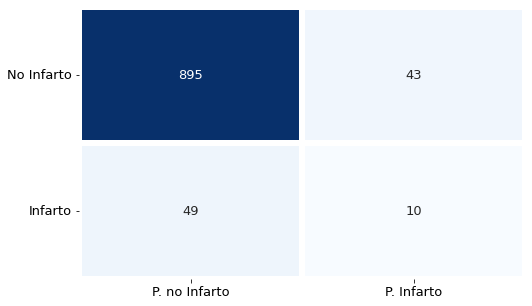

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       938
           1       0.19      0.17      0.18        59

    accuracy                           0.91       997
   macro avg       0.57      0.56      0.56       997
weighted avg       0.90      0.91      0.91       997

Accuracy: 0.9077231695085256
Precision: 0.18867924528301888
Recall: 0.1694915254237288
F1 Score: 0.17857142857142858
Kappa: 0.1298358789488664
AUROC: 0.5618246539698601

No se almacena este resulta porque YA EXISTE 
Matriz de confusion


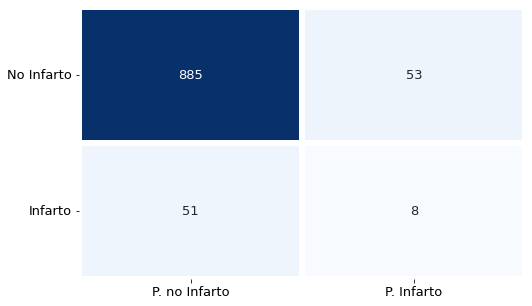

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       938
           1       0.13      0.14      0.13        59

    accuracy                           0.90       997
   macro avg       0.54      0.54      0.54       997
weighted avg       0.90      0.90      0.90       997

Accuracy: 0.8956870611835507
Precision: 0.13114754098360656
Recall: 0.13559322033898305
F1 Score: 0.13333333333333336
Kappa: 0.0778534711228901
AUROC: 0.6649199522966283

No se almacena este resulta porque YA EXISTE 


In [83]:
model_evaluation_and_store('Tree_balanced',tree_balanced,Y_test,X_test)
model_evaluation_and_store('RF_discretized_balanced',rdf_discretized_balanced,Y_test,X_discretized_test)

**Oversampling**

In [84]:
randomsampler = RandomOverSampler(sampling_strategy='minority')
X_randomover, Y_randomover = randomsampler.fit_resample(X, Y)
X_randomover_discretized, Y_randomover_discretized = randomsampler.fit_resample(X_discretized, Y)

In [85]:
tree_randomover = DecisionTreeClassifier(criterion = 'gini')
tree_randomover.fit(X_randomover,Y_randomover)
rdf_randomover_discretized = RandomForestClassifier(n_estimators= 20, criterion = 'gini')
rdf_randomover_discretized.fit(X_randomover_discretized,Y_randomover_discretized)

RandomForestClassifier(n_estimators=20)

Matriz de confusion


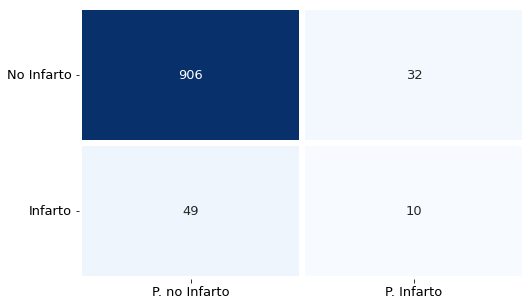

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.97      0.96       938
           1       0.24      0.17      0.20        59

    accuracy                           0.92       997
   macro avg       0.59      0.57      0.58       997
weighted avg       0.91      0.92      0.91       997

Accuracy: 0.9187562688064193
Precision: 0.23809523809523808
Recall: 0.1694915254237288
F1 Score: 0.19801980198019803
Kappa: 0.15650557232533602
AUROC: 0.5676881934154892

Modelo Tree_randomover almacenado en matriz de resultados
Matriz de confusion


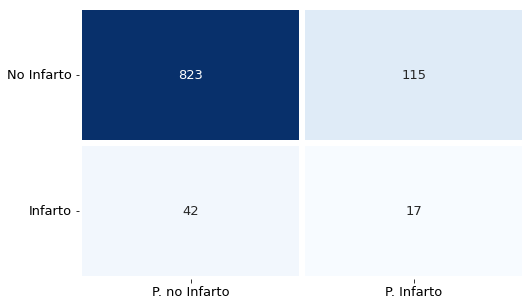

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.88      0.91       938
           1       0.13      0.29      0.18        59

    accuracy                           0.84       997
   macro avg       0.54      0.58      0.55       997
weighted avg       0.90      0.84      0.87       997

Accuracy: 0.8425275827482447
Precision: 0.12878787878787878
Recall: 0.288135593220339
F1 Score: 0.17801047120418848
Kappa: 0.10478636095875926
AUROC: 0.6890065411441582

Modelo RF_discretized_randomover almacenado en matriz de resultados


In [86]:
model_evaluation_and_store('Tree_randomover',tree_randomover,Y_test,X_test)
model_evaluation_and_store('RF_discretized_randomover',rdf_randomover_discretized,Y_test,X_discretized_test)

Matriz de confusion


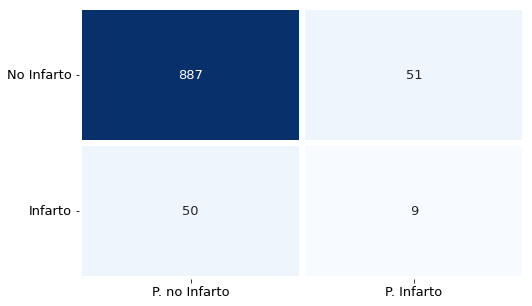

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       938
           1       0.15      0.15      0.15        59

    accuracy                           0.90       997
   macro avg       0.55      0.55      0.55       997
weighted avg       0.90      0.90      0.90       997

Accuracy: 0.8986960882647944
Precision: 0.15
Recall: 0.15254237288135594
F1 Score: 0.15126050420168066
Kappa: 0.09739788281060924
AUROC: 0.5491669979400817

Modelo Tree_smote_k_2 almacenado en matriz de resultados
Matriz de confusion


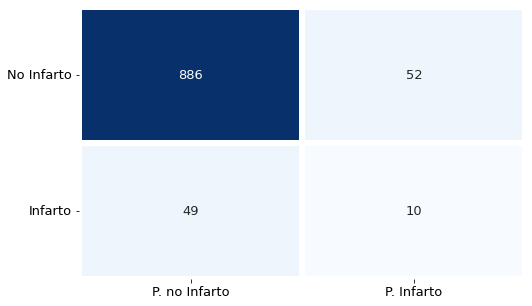

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       938
           1       0.16      0.17      0.17        59

    accuracy                           0.90       997
   macro avg       0.55      0.56      0.56       997
weighted avg       0.90      0.90      0.90       997

Accuracy: 0.8986960882647944
Precision: 0.16129032258064516
Recall: 0.1694915254237288
F1 Score: 0.1652892561983471
Kappa: 0.11140035827428285
AUROC: 0.5570272126052547

Modelo Tree_smote_k_3 almacenado en matriz de resultados
Matriz de confusion


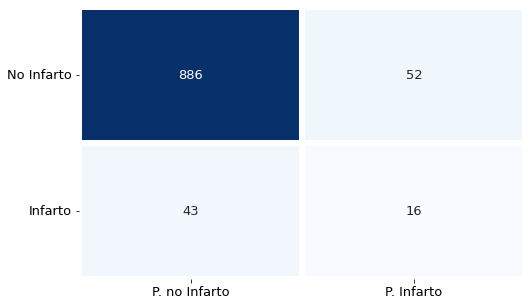

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       938
           1       0.24      0.27      0.25        59

    accuracy                           0.90       997
   macro avg       0.59      0.61      0.60       997
weighted avg       0.91      0.90      0.91       997

Accuracy: 0.9047141424272819
Precision: 0.23529411764705882
Recall: 0.2711864406779661
F1 Score: 0.25196850393700787
Kappa: 0.2013575614486277
AUROC: 0.6078746702323733

Modelo Tree_smote_k_4 almacenado en matriz de resultados
Matriz de confusion


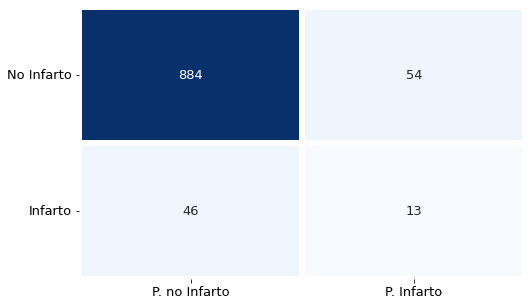

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       938
           1       0.19      0.22      0.21        59

    accuracy                           0.90       997
   macro avg       0.57      0.58      0.58       997
weighted avg       0.91      0.90      0.90       997

Accuracy: 0.8996990972918756
Precision: 0.19402985074626866
Recall: 0.22033898305084745
F1 Score: 0.20634920634920637
Kappa: 0.15304631485949238
AUROC: 0.5813848433377905

Modelo Tree_smote_k_5 almacenado en matriz de resultados
Matriz de confusion


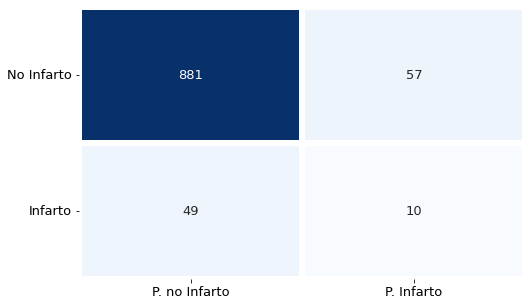

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       938
           1       0.15      0.17      0.16        59

    accuracy                           0.89       997
   macro avg       0.55      0.55      0.55       997
weighted avg       0.90      0.89      0.90       997

Accuracy: 0.8936810431293881
Precision: 0.14925373134328357
Recall: 0.1694915254237288
F1 Score: 0.15873015873015872
Kappa: 0.10222909375106193
AUROC: 0.5543619674026959

Modelo Tree_smote_k_6 almacenado en matriz de resultados
Matriz de confusion


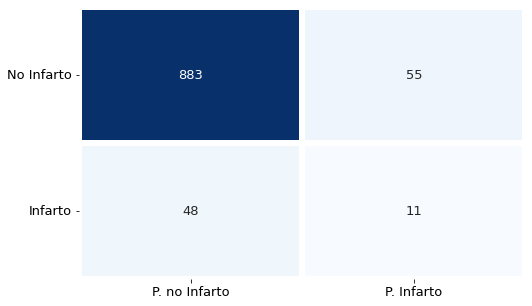

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       938
           1       0.17      0.19      0.18        59

    accuracy                           0.90       997
   macro avg       0.56      0.56      0.56       997
weighted avg       0.90      0.90      0.90       997

Accuracy: 0.8966900702106319
Precision: 0.16666666666666666
Recall: 0.1864406779661017
F1 Score: 0.176
Kappa: 0.12107465956845864
AUROC: 0.5639026417549059

Modelo Tree_smote_k_7 almacenado en matriz de resultados
Matriz de confusion


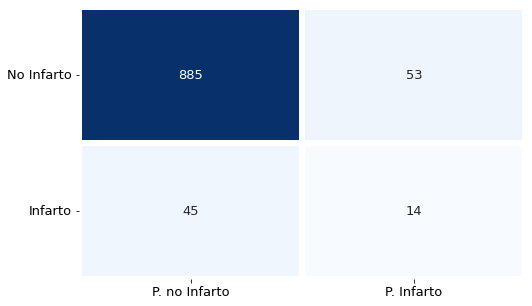

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       938
           1       0.21      0.24      0.22        59

    accuracy                           0.90       997
   macro avg       0.58      0.59      0.58       997
weighted avg       0.91      0.90      0.90       997

Accuracy: 0.9017051153460381
Precision: 0.208955223880597
Recall: 0.23728813559322035
F1 Score: 0.22222222222222224
Kappa: 0.1699853885623025
AUROC: 0.5903924686494887

Modelo Tree_smote_k_8 almacenado en matriz de resultados
Matriz de confusion


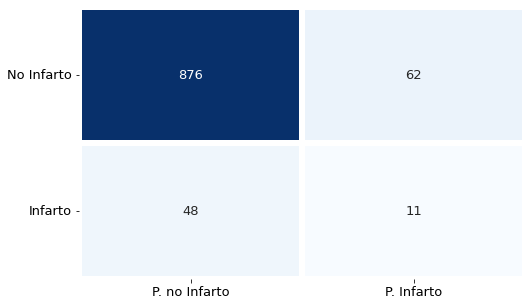

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.93      0.94       938
           1       0.15      0.19      0.17        59

    accuracy                           0.89       997
   macro avg       0.55      0.56      0.55       997
weighted avg       0.90      0.89      0.90       997

Accuracy: 0.8896690070210632
Precision: 0.1506849315068493
Recall: 0.1864406779661017
F1 Score: 0.16666666666666666
Kappa: 0.1083014879258476
AUROC: 0.5601712984713237

Modelo Tree_smote_k_9 almacenado en matriz de resultados
Matriz de confusion


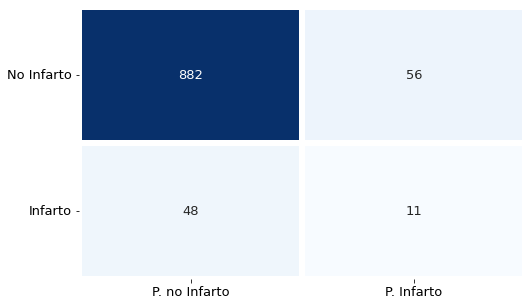

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       938
           1       0.16      0.19      0.17        59

    accuracy                           0.90       997
   macro avg       0.56      0.56      0.56       997
weighted avg       0.90      0.90      0.90       997

Accuracy: 0.8956870611835507
Precision: 0.16417910447761194
Recall: 0.1864406779661017
F1 Score: 0.17460317460317462
Kappa: 0.11916816745387204
AUROC: 0.5633695927143941

Modelo Tree_smote_k_10 almacenado en matriz de resultados


In [87]:
tree_smote_n = []
for i in range(2,11):
  tree_smote_n.append(SMOTE(sampling_strategy='minority', k_neighbors = i))
  X_smoteover, Y_smoteover = tree_smote_n[i-2].fit_resample(X, Y)
  tree_smote = DecisionTreeClassifier(criterion = 'gini')
  tree_smote.fit(X_smoteover,Y_smoteover)
  model_evaluation_and_store('Tree_smote_k_{}'.format(i),tree_smote,Y_test,X_test)

Matriz de confusion


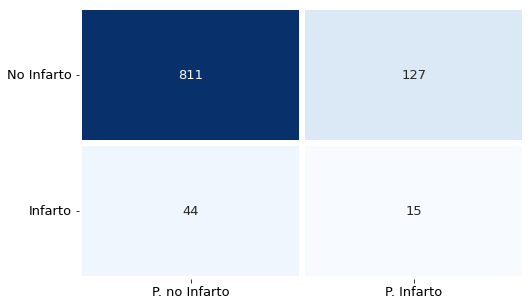

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       938
           1       0.11      0.25      0.15        59

    accuracy                           0.83       997
   macro avg       0.53      0.56      0.53       997
weighted avg       0.90      0.83      0.86       997

Accuracy: 0.8284854563691073
Precision: 0.1056338028169014
Recall: 0.2542372881355932
F1 Score: 0.1492537313432836
Kappa: 0.07162888461726957
AUROC: 0.7089461891510969

Modelo RF_discretized_smote_k_2 almacenado en matriz de resultados
Matriz de confusion


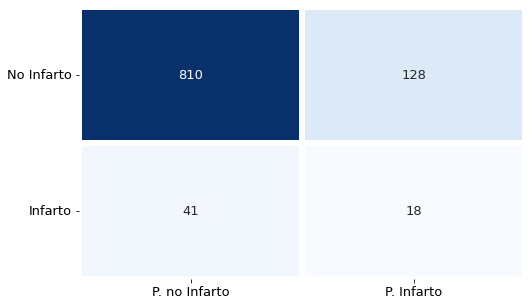

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.91       938
           1       0.12      0.31      0.18        59

    accuracy                           0.83       997
   macro avg       0.54      0.58      0.54       997
weighted avg       0.90      0.83      0.86       997

Accuracy: 0.8304914744232698
Precision: 0.1232876712328767
Recall: 0.3050847457627119
F1 Score: 0.17560975609756097
Kappa: 0.09972376133406713
AUROC: 0.6766199269993856

Modelo RF_discretized_smote_k_3 almacenado en matriz de resultados
Matriz de confusion


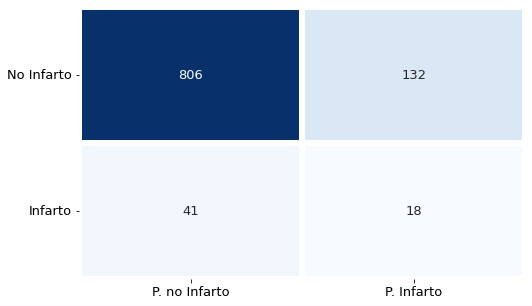

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       938
           1       0.12      0.31      0.17        59

    accuracy                           0.83       997
   macro avg       0.54      0.58      0.54       997
weighted avg       0.90      0.83      0.86       997

Accuracy: 0.8264794383149449
Precision: 0.12
Recall: 0.3050847457627119
F1 Score: 0.17224880382775118
Kappa: 0.09540941821862559
AUROC: 0.6996946261428934

Modelo RF_discretized_smote_k_4 almacenado en matriz de resultados
Matriz de confusion


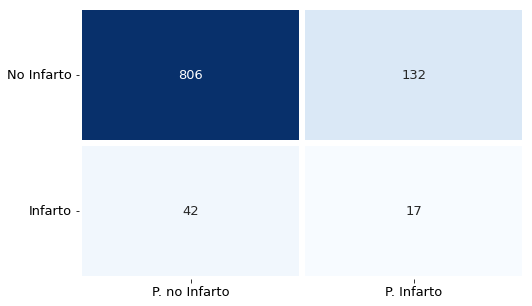

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       938
           1       0.11      0.29      0.16        59

    accuracy                           0.83       997
   macro avg       0.53      0.57      0.53       997
weighted avg       0.90      0.83      0.86       997

Accuracy: 0.8254764292878636
Precision: 0.11409395973154363
Recall: 0.288135593220339
F1 Score: 0.16346153846153846
Kappa: 0.0859668904180323
AUROC: 0.6832694879115319

Modelo RF_discretized_smote_k_5 almacenado en matriz de resultados
Matriz de confusion


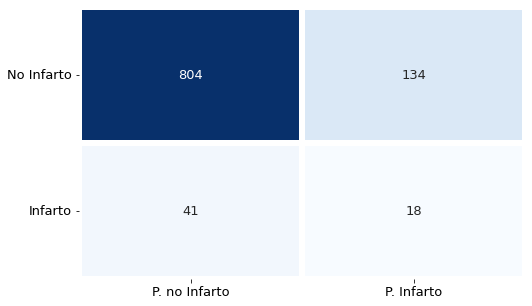

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       938
           1       0.12      0.31      0.17        59

    accuracy                           0.82       997
   macro avg       0.53      0.58      0.54       997
weighted avg       0.90      0.82      0.86       997

Accuracy: 0.8244734202607823
Precision: 0.11842105263157894
Recall: 0.3050847457627119
F1 Score: 0.17061611374407581
Kappa: 0.09331136875035717
AUROC: 0.6858263163600883

Modelo RF_discretized_smote_k_6 almacenado en matriz de resultados
Matriz de confusion


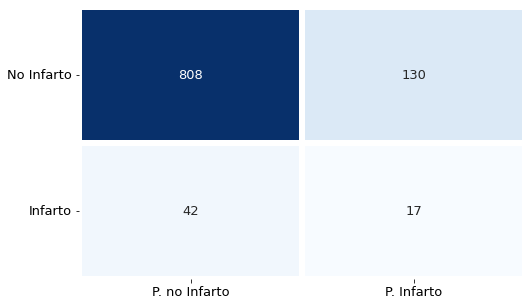

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       938
           1       0.12      0.29      0.17        59

    accuracy                           0.83       997
   macro avg       0.53      0.57      0.53       997
weighted avg       0.90      0.83      0.86       997

Accuracy: 0.827482447342026
Precision: 0.11564625850340136
Recall: 0.288135593220339
F1 Score: 0.1650485436893204
Kappa: 0.08802569720691777
AUROC: 0.6904249936756894

Modelo RF_discretized_smote_k_7 almacenado en matriz de resultados
Matriz de confusion


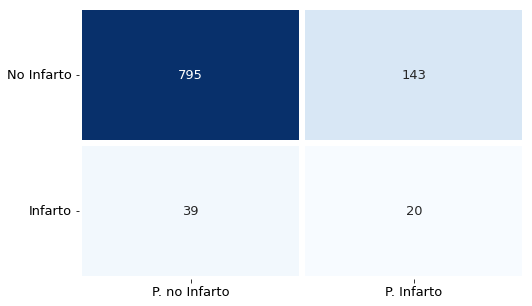

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.85      0.90       938
           1       0.12      0.34      0.18        59

    accuracy                           0.82       997
   macro avg       0.54      0.59      0.54       997
weighted avg       0.90      0.82      0.85       997

Accuracy: 0.8174523570712137
Precision: 0.12269938650306748
Recall: 0.3389830508474576
F1 Score: 0.18018018018018017
Kappa: 0.10215734784760011
AUROC: 0.6952585739582957

Modelo RF_discretized_smote_k_8 almacenado en matriz de resultados
Matriz de confusion


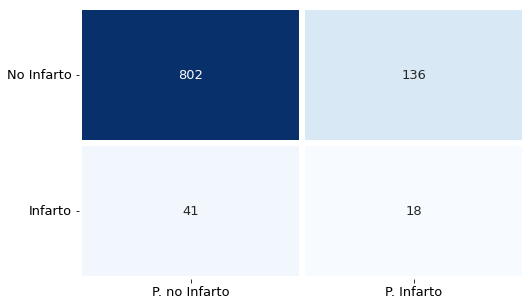

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.90       938
           1       0.12      0.31      0.17        59

    accuracy                           0.82       997
   macro avg       0.53      0.58      0.53       997
weighted avg       0.90      0.82      0.86       997

Accuracy: 0.8224674022066198
Precision: 0.11688311688311688
Recall: 0.3050847457627119
F1 Score: 0.16901408450704225
Kappa: 0.09125130671665238
AUROC: 0.6916537168877164

Modelo RF_discretized_smote_k_9 almacenado en matriz de resultados
Matriz de confusion


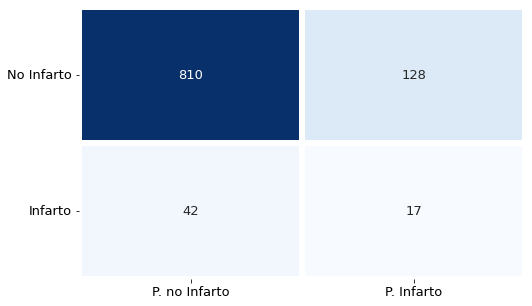

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.86      0.91       938
           1       0.12      0.29      0.17        59

    accuracy                           0.83       997
   macro avg       0.53      0.58      0.54       997
weighted avg       0.90      0.83      0.86       997

Accuracy: 0.8294884653961886
Precision: 0.11724137931034483
Recall: 0.288135593220339
F1 Score: 0.16666666666666666
Kappa: 0.09012336400433774
AUROC: 0.7048353872285065

Modelo RF_discretized_smote_k_10 almacenado en matriz de resultados


In [88]:
rdf_smote_n = []
for i in range(2,11):
  rdf_smote_n.append(SMOTE(sampling_strategy='minority', k_neighbors = i))
  X_smoteover, Y_smoteover = rdf_smote_n[i-2].fit_resample(X_discretized, Y)
  rdf_smote = RandomForestClassifier(n_estimators= 20, criterion = 'gini')
  rdf_smote.fit(X_smoteover,Y_smoteover)
  model_evaluation_and_store('RF_discretized_smote_k_{}'.format(i),rdf_smote,Y_test,X_discretized_test)

**Undersampling**

In [89]:
randomundersampler = RandomUnderSampler(sampling_strategy='majority')
X_randomunder, Y_randomunder = randomundersampler.fit_resample(X, Y)
X_randomunder_discretized, Y_randomunder_discretized = randomundersampler.fit_resample(X_discretized, Y)

In [90]:
tree_randomunder = DecisionTreeClassifier(criterion = 'gini')
tree_randomunder.fit(X_randomunder,Y_randomunder)
rdf_randomunder_discretized = RandomForestClassifier(n_estimators= 20, criterion = 'gini')
rdf_randomunder_discretized.fit(X_randomunder_discretized,Y_randomunder_discretized)

RandomForestClassifier(n_estimators=20)

Matriz de confusion


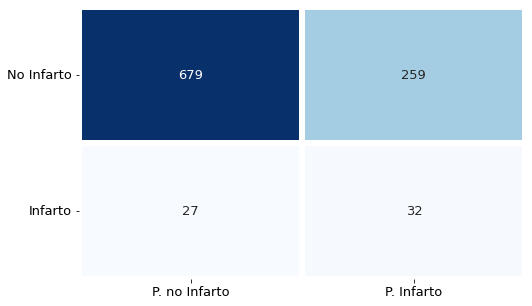

Clasification report
              precision    recall  f1-score   support

           0       0.96      0.72      0.83       938
           1       0.11      0.54      0.18        59

    accuracy                           0.71       997
   macro avg       0.54      0.63      0.50       997
weighted avg       0.91      0.71      0.79       997

Accuracy: 0.7131394182547643
Precision: 0.10996563573883161
Recall: 0.5423728813559322
F1 Score: 0.18285714285714288
Kappa: 0.09367093435724005
AUROC: 0.6331267391854287

Modelo Tree_randomunder almacenado en matriz de resultados
Matriz de confusion


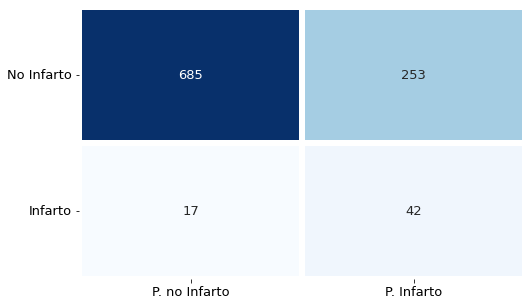

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.73      0.84       938
           1       0.14      0.71      0.24        59

    accuracy                           0.73       997
   macro avg       0.56      0.72      0.54       997
weighted avg       0.93      0.73      0.80       997

Accuracy: 0.7291875626880642
Precision: 0.1423728813559322
Recall: 0.711864406779661
F1 Score: 0.23728813559322035
Kappa: 0.1538311622994517
AUROC: 0.7947670846734849

Modelo RF_randomunder_discretized almacenado en matriz de resultados


In [91]:
model_evaluation_and_store('Tree_randomunder',tree_randomunder,Y_test,X_test)
model_evaluation_and_store('RF_randomunder_discretized',rdf_randomunder_discretized,Y_test,X_discretized_test)

In [92]:
clustercentroidsundersampler = ClusterCentroids(sampling_strategy='majority')
X_centroidsunder, Y_centroidsunder = clustercentroidsundersampler.fit_resample(X, Y)
X_centroidsunder_discretized, Y_centroidsunder_discretized = clustercentroidsundersampler.fit_resample(X_discretized, Y)

In [93]:
tree_centroidunder = DecisionTreeClassifier(criterion = 'gini')
tree_centroidunder.fit(X_centroidsunder,Y_centroidsunder)
rdf_centroidunder_discretized = RandomForestClassifier(n_estimators= 20, criterion = 'gini')
rdf_centroidunder_discretized.fit(X_centroidsunder_discretized,Y_centroidsunder_discretized)

RandomForestClassifier(n_estimators=20)

Matriz de confusion


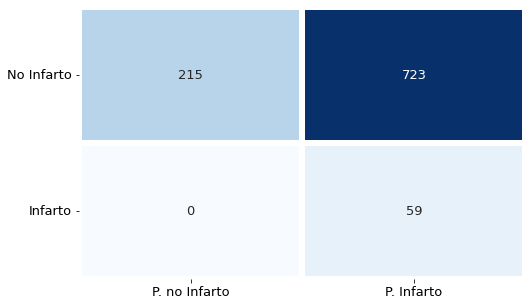

Clasification report
              precision    recall  f1-score   support

           0       1.00      0.23      0.37       938
           1       0.08      1.00      0.14        59

    accuracy                           0.27       997
   macro avg       0.54      0.61      0.26       997
weighted avg       0.95      0.27      0.36       997

Accuracy: 0.2748244734202608
Precision: 0.07544757033248081
Recall: 1.0
F1 Score: 0.1403091557669441
Kappa: 0.033998882338672654
AUROC: 0.6146055437100213

Modelo Tree_centroidunder almacenado en matriz de resultados
Matriz de confusion


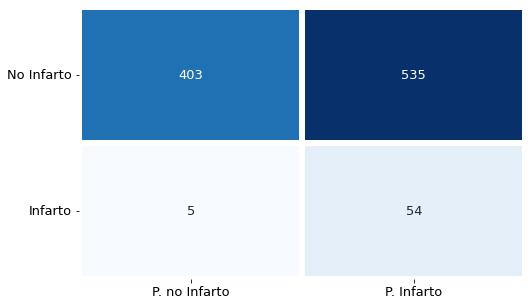

Clasification report
              precision    recall  f1-score   support

           0       0.99      0.43      0.60       938
           1       0.09      0.92      0.17        59

    accuracy                           0.46       997
   macro avg       0.54      0.67      0.38       997
weighted avg       0.93      0.46      0.57       997

Accuracy: 0.4583751253761284
Precision: 0.09168081494057725
Recall: 0.9152542372881356
F1 Score: 0.16666666666666669
Kappa: 0.06621062380973852
AUROC: 0.7174026959632829

Modelo RF_discretized_centroidunder almacenado en matriz de resultados


In [94]:
model_evaluation_and_store('Tree_centroidunder',tree_centroidunder,Y_test,X_test)
model_evaluation_and_store('RF_discretized_centroidunder'.format(i),rdf_centroidunder_discretized,Y_test,X_discretized_test)

In [95]:
results_matrix.iloc[:,:-3]

,Nombre,Modelo,Accuracy,Precision,Recall,F1-Score,kappa,auc_score
0,SimpleLR,LogisticRegression(),0.940822,0.000000,0.000000,0.000000,0.000000,0.834592
1,LR_balanced,LogisticRegression(class_weight='balanced'),0.774323,0.180769,0.796610,0.294671,0.219367,0.831719
2,LR_custom_balanced,"LogisticRegression(class_weight={0: 0.4, 1: 11})",0.729188,0.154098,0.796610,0.258242,0.176583,0.830816
3,LR_gridsearch_balanced,LogisticRegression(class_weight={0: 0.08954773...,0.838516,0.185185,0.508475,0.271493,0.202285,0.827943
4,LR_randomover,LogisticRegression(),0.773320,0.180077,0.796610,0.293750,0.218289,0.832677
5,LR_smote_k_2,LogisticRegression(),0.767302,0.173585,0.779661,0.283951,0.207206,0.834628
6,LR_smote_k_3,LogisticRegression(),0.768305,0.174242,0.779661,0.284830,0.208238,0.832099
7,LR_smote_k_4,LogisticRegression(),0.766299,0.172932,0.779661,0.283077,0.206180,0.830274
8,LR_smote_k_5,LogisticRegression(),0.770311,0.175573,0.779661,0.286604,0.210320,0.831358
9,LR_smote_k_6,LogisticRegression(),0.773320,0.177606,0.779661,0.289308,0.213492,0.832243


**Soluciones mixtas**

Matriz de confusion


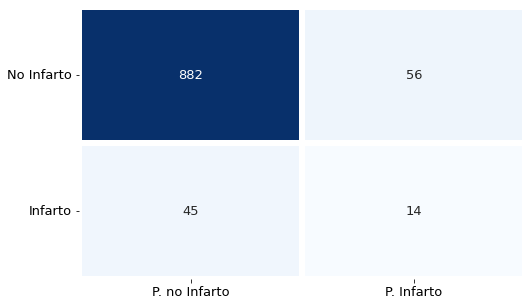

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       938
           1       0.20      0.24      0.22        59

    accuracy                           0.90       997
   macro avg       0.58      0.59      0.58       997
weighted avg       0.91      0.90      0.90       997

Accuracy: 0.8986960882647944
Precision: 0.2
Recall: 0.23728813559322035
F1 Score: 0.21705426356589147
Kappa: 0.1633195682700057
AUROC: 0.5889198077409562

Modelo Tree_geldedsmote_balanced almacenado en matriz de resultados


In [96]:
sampling_percentage = 0.5
tree_smote = SMOTE(sampling_strategy=sampling_percentage, k_neighbors = 10)
X_smoteover, Y_smoteover = tree_smote.fit_resample(X, Y)
tree_smote = DecisionTreeClassifier(criterion = 'gini',class_weight = 'balanced')
tree_smote.fit(X_smoteover,Y_smoteover)
model_evaluation_and_store('Tree_geldedsmote_balanced',tree_smote,Y_test,X_test)

Matriz de confusion


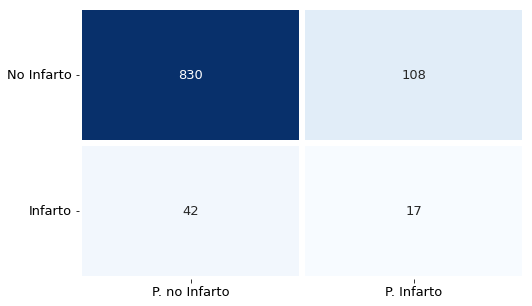

Clasification report
              precision    recall  f1-score   support

           0       0.95      0.88      0.92       938
           1       0.14      0.29      0.18        59

    accuracy                           0.85       997
   macro avg       0.54      0.59      0.55       997
weighted avg       0.90      0.85      0.87       997

Accuracy: 0.8495486459378134
Precision: 0.136
Recall: 0.288135593220339
F1 Score: 0.18478260869565216
Kappa: 0.11350460586373279
AUROC: 0.6953579559827979

Modelo RF_randomover_balanced almacenado en matriz de resultados


In [97]:
randomsampler = RandomOverSampler(sampling_strategy=sampling_percentage)
X_randomover_discretized, Y_randomover_discretized = randomsampler.fit_resample(X_discretized, Y)
rdf_randomover_discretized = RandomForestClassifier(n_estimators= 20, criterion = 'gini',class_weight = 'balanced')
rdf_randomover_discretized.fit(X_randomover_discretized,Y_randomover_discretized)
model_evaluation_and_store('RF_randomover_balanced',rdf_randomover_discretized,Y_test,X_discretized_test)

## Resultados

In [102]:
results_matrix.to_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/results.csv')

In [110]:
results_matrix[['Nombre','Accuracy','Precision','Recall','F1-Score','kappa','auc_score','ConfusioMatrix']].to_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/results_data.csv')

In [276]:
print('LRbalanced,LRgeldedsmotebalanced,LRrandomover,LRsmotek9,LRsmotek6,LRsmotek5,LRsmotek10,LRsmotek3,LRsmotek7,LRsmotek8,LRsmotek2,LRsmotek4,LRgeldedrandomunderbalanced,LRgridsearchbalanced,SimpleTree,Treesmotek4,LRrandomunder,LRcustombalanced,Treesmotek8,Treegeldedsmotebalanced,LRcentroidsunder,Treerandomover,RFrandomunderdiscretized,Treesmotek5,Treebalanced,Treesmotek7,Treesmotek10,RFrandomoverbalanced,Treesmotek3,Treesmotek9,RFdiscretizedrandomover,Treesmotek6,RFdiscretizedsmotek8,RFdiscretizedsmotek3,Treesmotek2,RFdiscretizedsmotek4,Treerandomunder,RFdiscretizedsmotek6,RFdiscretizedsmotek9,RFdiscretizedsmotek10,RFdiscretizedsmotek7,RFdiscretizedsmotek5,SimpleTreediscretized,RFdiscretizedbalanced,RFdiscretizedsmotek2,RFdiscretizedcentroidunder,rfdiscretized,Treecentroidunder,SimpleRF,SimpleLR'.replace(',',', '))

LRbalanced, LRgeldedsmotebalanced, LRrandomover, LRsmotek9, LRsmotek6, LRsmotek5, LRsmotek10, LRsmotek3, LRsmotek7, LRsmotek8, LRsmotek2, LRsmotek4, LRgeldedrandomunderbalanced, LRgridsearchbalanced, SimpleTree, Treesmotek4, LRrandomunder, LRcustombalanced, Treesmotek8, Treegeldedsmotebalanced, LRcentroidsunder, Treerandomover, RFrandomunderdiscretized, Treesmotek5, Treebalanced, Treesmotek7, Treesmotek10, RFrandomoverbalanced, Treesmotek3, Treesmotek9, RFdiscretizedrandomover, Treesmotek6, RFdiscretizedsmotek8, RFdiscretizedsmotek3, Treesmotek2, RFdiscretizedsmotek4, Treerandomunder, RFdiscretizedsmotek6, RFdiscretizedsmotek9, RFdiscretizedsmotek10, RFdiscretizedsmotek7, RFdiscretizedsmotek5, SimpleTreediscretized, RFdiscretizedbalanced, RFdiscretizedsmotek2, RFdiscretizedcentroidunder, rfdiscretized, Treecentroidunder, SimpleRF, SimpleLR


In [278]:
results_matrix.iloc[:,:-3]

,Nombre,Modelo,Accuracy,Precision,Recall,F1-Score,kappa,auc_score


In [111]:
results_matrix.iloc[:,:-3]

,Nombre,Modelo,Accuracy,Precision,Recall,F1-Score,kappa,auc_score
0,SimpleLR,LogisticRegression(),0.940822,0.000000,0.000000,0.000000,0.000000,0.834592
1,LR_balanced,LogisticRegression(class_weight='balanced'),0.774323,0.180769,0.796610,0.294671,0.219367,0.831719
2,LR_custom_balanced,"LogisticRegression(class_weight={0: 0.4, 1: 11})",0.729188,0.154098,0.796610,0.258242,0.176583,0.830816
3,LR_gridsearch_balanced,LogisticRegression(class_weight={0: 0.08954773...,0.838516,0.185185,0.508475,0.271493,0.202285,0.827943
4,LR_randomover,LogisticRegression(),0.773320,0.180077,0.796610,0.293750,0.218289,0.832677
5,LR_smote_k_2,LogisticRegression(),0.767302,0.173585,0.779661,0.283951,0.207206,0.834628
6,LR_smote_k_3,LogisticRegression(),0.768305,0.174242,0.779661,0.284830,0.208238,0.832099
7,LR_smote_k_4,LogisticRegression(),0.766299,0.172932,0.779661,0.283077,0.206180,0.830274
8,LR_smote_k_5,LogisticRegression(),0.770311,0.175573,0.779661,0.286604,0.210320,0.831358
9,LR_smote_k_6,LogisticRegression(),0.773320,0.177606,0.779661,0.289308,0.213492,0.832243


In [277]:
results_matrix.sort_values(by = ['F1-Score','auc_score','kappa'],ascending = False).iloc[:,:-3][['Nombre','F1-Score','kappa','auc_score','Accuracy','Precision','Recall']]

,Nombre,F1-Score,kappa,auc_score,Accuracy,Precision,Recall


Para elegir el mejor modelo hacemos uso de una ordanción embebida en pandas en función del F1-Score, AUROC y Kappa. Podemos apreciar que los mejores modelos son muy similares y que el orden de los mejores modelos inviertiendo el orden del sort no habría modificado nada la selección. 

El orden de KAPPA coincide en mayor medida con el orden de F1. Esta coeficiente es my interesante ya que mide la tasa de acierto. como el accuracy, pero eliminando la posibilidad de acertar al azar. Para ello calcula el la proporción de cada clase representado en el conjunto de test. Como pudimos apreciar el conjunto de Test estaba realizado de tal forma que mantenia, con cierta aleatoriedad, la proporción de los datos reales.

 Uno de los más basicos "LR balanced" que es basicamente la regresión logistica con los pesos de las clases en función de su frecuencia es el segudo mejor modelo, unicamente diferenciandose con el AUCSCORE en 0.0001. Esta diferencia es poco significativa por lo que podemos considerar ambos modelos identicos.

In [149]:
def print_roc(data,legend = False):
  plt.figure(figsize=(10,10))
  random_probs = [0 for i in range(len(Y_test))]
  colors = ['orange','red','green','purple','cyan']
  for index, row in data.iterrows():
    plt.plot(row['roc_curve'][0], row['roc_curve'][1],linestyle='--', label=row['Nombre'])
  p_fpr, p_tpr, _ = roc_curve(Y_test, random_probs, pos_label=1)
  plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
  plt.title('Curva ROC')
  if legend: plt.legend()
  plt.xlabel('FPR')
  plt.ylabel('TPR')
  plt.show();

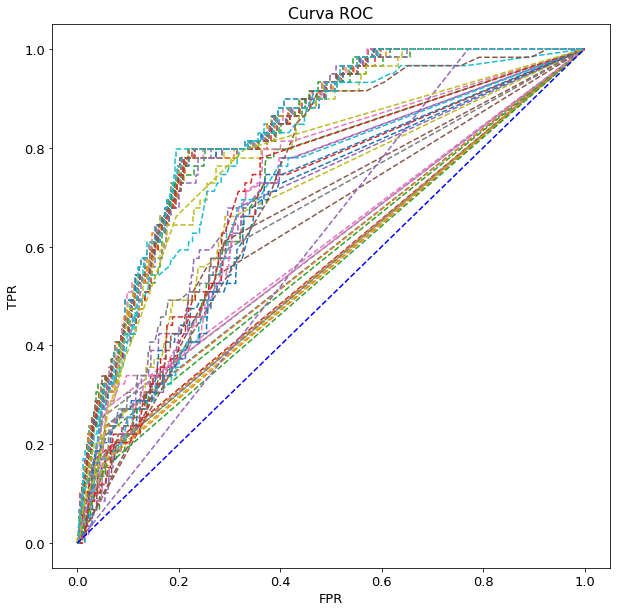

In [144]:
print_roc( results_matrix.sort_values(by = ['F1-Score','auc_score'],ascending = False))

Vemos en esta imagen la curva ROC para todos los modelos entrenados. Esta grafica compara los True Positive Rate vs los False Positive rates. Vamos que todos ellos son mejores que la linea y = x que representaría una clasificación aleatoria.

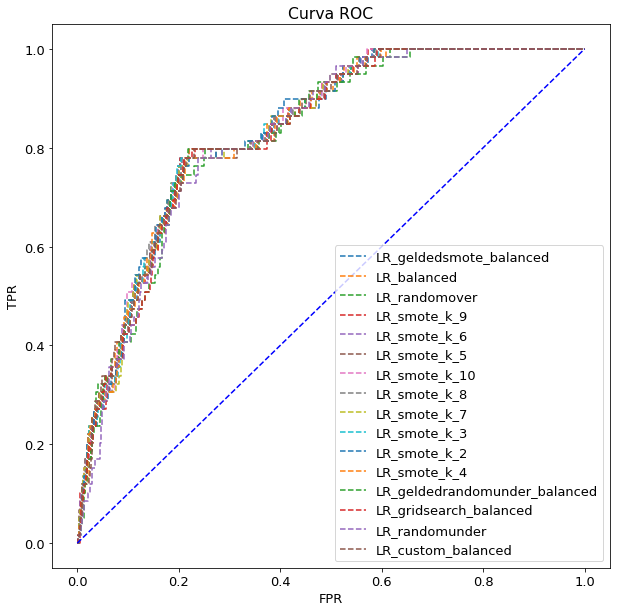

In [150]:
print_roc(results_matrix.sort_values(by = ['F1-Score','auc_score'],ascending = False).head(16),True)

Volvemos a graficar las curvas y podemos apreciar que los 5 primeros modelos tienen una Curva Roc casi identica. Con curvas casi idénticas podemos esperar que sus AUROC (areas bajo la curva) sean tambien casi idénticas.

In [151]:
results_matrix.sort_values(by = ['F1-Score','auc_score'],ascending = False).head(16)[['auc_score']]

,auc_score
16,0.831900
1,0.831719
4,0.832677
12,0.832081
9,0.832243
8,0.831358
13,0.833327
11,0.832948
10,0.832117
6,0.832099


Se va a plotear 5 modelos random para poder ver mas sencillamente las verdaderas diferencias entre los modelos.

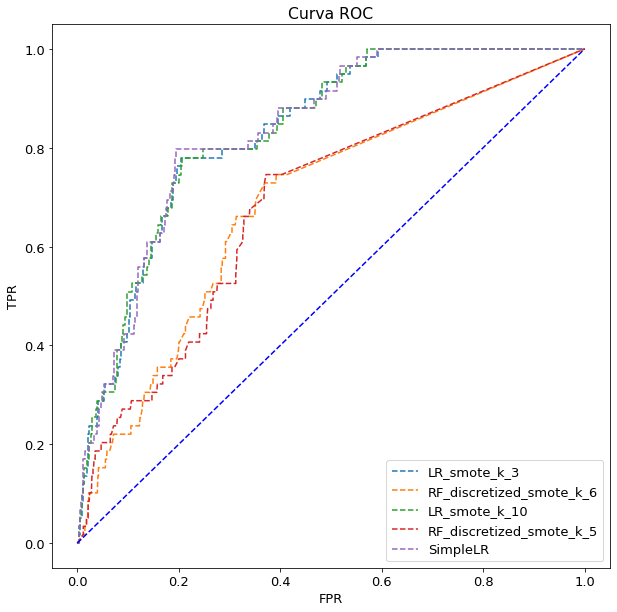

In [153]:
print_roc(results_matrix.sample(5),True)

## Experimentacion

Esta ultima sección es adicional al trabajo obligatorio. Analizando las matrices de confusión de los modelos entrenados me cercioné que la regresión logística era mejor para pronosticar los valores de Infartos mientras que los árboles daban mejores resultados pronosticando los valores de No Infartos

En mi afán d ebuscar un mejor modelo pero sin salirme del scope de la practica en si Arboles y Regresores Logísticos se me ocurrió combianar ambos modelos en uno solo (Ensemble Learning) para producir un modelo mas robusto final. Hay que tener en cuenta que el Random Forest ya es en sí un Ensemble pero quería ir un poco más alla. 

Aprovechando lo aprendido en Redes de Neuronas donde estamos aprendiendo a personalizar la arquitectura de una red definiendo las funciones de forward y backward se me ocurrió unificar los dos mejores modelos previos para computar las pertenecias a las clases y que esto fuera una entrada a un último Regresor Logístico que aprendiera de las clases generadas para computar la salida más correcta.

Para eso primero reentrené los mejores modelos con unos datos similares ya que habia entrenado cada uno de los tipos (LR y RF) con datos diferentes y utilicé como entrada de la "red" generada. Es importante puntualizar que el entrenaiento solo se produce en el Regresor Logístico final no se buscaba reentrenar dichos modelos.

Primero generá un modelo que utilizaba de entrada la predicción de los clasificadores y viendo que tenia resultados malos utilicé despues en un modelo las probabilidades de pertenencia a cada clase que escupen los modelo de sklearn con la funcion model.predict_proba()

Al final me quedé sin tiempo para hacer la memoria de la entrega por lo que cesé en mi búsqueda. Posiblemente con algo mas de tiempo podría haber llegado a mejores resultados que ambos modelos por separado...

In [156]:
train_data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/train_dataset_raw.csv',index_col=False)
test_data = pd.read_csv('/content/drive/MyDrive/Master IA/AA/Practica 1/test_dataset_raw.csv',index_col=False)
train_data.drop(columns = ['Unnamed: 0'], inplace = True)
test_data.drop(columns = ['Unnamed: 0'], inplace = True)

train_data['Edad'] = train_data['Edad'].round()
test_data['Edad'] = test_data['Edad'].round()

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder

def tranform_cat_variables(data):  
  OneHot = ColumnTransformer(transformers= [('encoder', OneHotEncoder(), [0,1,2,7])], remainder= 'passthrough')
  Label = LabelEncoder()
  x = np.array(OneHot.fit_transform(data.to_numpy()))
  x[:,12] = Label.fit_transform(x[:,12])
  return pd.DataFrame(x,columns = ['Hombre','Mujer','Autonomo','Funcionario','Menor','Privado','Ciudad','Rural','Nunca_ha_fumado','Fuma','Fumo_pasado','No_contesta','Casado','Edad','Hipertension','Enfermedad_Corazon','Nivel_medio_glucosa','IMC','Infarto'])

train_data = tranform_cat_variables(train_data)
test_data = tranform_cat_variables(test_data)

max = train_data.max()
min = train_data.min()

for column_name in ['Edad','Nivel_medio_glucosa','IMC']:
    train_data[column_name] = (train_data[column_name]-min[column_name])/(max[column_name] - min[column_name])
    test_data[column_name] = (test_data[column_name]-min[column_name])/(max[column_name] - min[column_name])
    train_data[column_name] = train_data[column_name].astype(float).round(4)
    test_data[column_name] = test_data[column_name].astype(float).round(4)





In [157]:
X_test = test_data[test_data.columns[:-1]].to_numpy()
Y_test = test_data[test_data.columns[-1]].astype('int').to_numpy()
X = train_data[train_data.columns[:-1]].to_numpy()
Y = train_data[train_data.columns[-1]].astype('int').to_numpy()

In [158]:
from imblearn.over_sampling import RandomOverSampler, SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix,classification_report
def conf_visualization(confusion_matrix):
  plt.figure(figsize = (8, 5))
  sns.heatmap(confusion_matrix, cmap = 'Blues', annot = True, fmt = 'd', linewidths = 5, cbar = False, 
            yticklabels = ['No Infarto', 'Infarto'], xticklabels = ['P. no Infarto', 'P. Infarto'])
  plt.yticks(rotation = 0)
  plt.show()

def model_evaluation(Y_test, Y_pred):
  confusion = confusion_matrix(Y_test,Y_pred)
  classifi = classification_report(Y_test,Y_pred)
  acc = accuracy_score(Y_test,Y_pred)
  prec = precision_score(Y_test,Y_pred)
  rec = recall_score(Y_test,Y_pred) 
  f1 = f1_score(Y_test,Y_pred)

  print('Matriz de confusion')
  conf_visualization(confusion)
  print('Clasification report')
  print(classifi)
  print('Accuracy: {}'.format(acc))
  print('Precision: {}'.format(prec))
  print('Recall: {}'.format(rec))
  print('F1 Score: {}'.format(f1))

Matriz de confusion


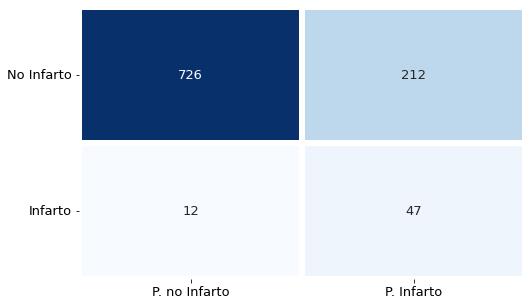

Clasification report
              precision    recall  f1-score   support

           0       0.98      0.77      0.87       938
           1       0.18      0.80      0.30        59

    accuracy                           0.78       997
   macro avg       0.58      0.79      0.58       997
weighted avg       0.94      0.78      0.83       997

Accuracy: 0.7753259779338014
Precision: 0.18146718146718147
Recall: 0.7966101694915254
F1 Score: 0.2955974842767296


In [159]:
sampling_percentage = 0.5
gelded_smote = SMOTE(sampling_strategy=sampling_percentage, k_neighbors = 9)
X_geldedsmote, Y_geldedsmote = gelded_smote.fit_resample(X, Y)

LR_geldedsmote = LogisticRegression(class_weight= 'balanced')
LR_geldedsmote.fit(X_geldedsmote,Y_geldedsmote)
model_evaluation(Y_test,LR_geldedsmote.predict(X_test))

Matriz de confusion


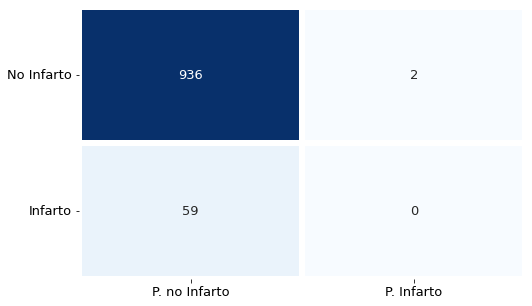

Clasification report
              precision    recall  f1-score   support

           0       0.94      1.00      0.97       938
           1       0.00      0.00      0.00        59

    accuracy                           0.94       997
   macro avg       0.47      0.50      0.48       997
weighted avg       0.89      0.94      0.91       997

Accuracy: 0.9388164493480441
Precision: 0.0
Recall: 0.0
F1 Score: 0.0


In [160]:
from sklearn.ensemble import RandomForestClassifier
rdf = RandomForestClassifier(n_estimators= 20, criterion = 'entropy')
rdf.fit(X,Y)
model_evaluation(Y_test,rdf.predict(X_test))

In [169]:
import pickle
filename_tree = '/content/drive/MyDrive/Master IA/AA/Practica 1/best_tree.csv'
filename_lr =  '/content/drive/MyDrive/Master IA/AA/Practica 1/best_lr.csv'
#pickle.dump(rdf, open(filename_tree, 'wb'))
#pickle.dump(LR_geldedsmote, open(filename_lr, 'wb'))

In [164]:
from torch import nn
from torch import optim
import torch

In [234]:
class LR_compact(nn.Module):
    def __init__(self,dimx, sgd_iterations=1000, lr=0.001, print_every=200):
        super().__init__()

        self.first_lr = pickle.load(open(filename_lr, 'rb'))
        self.rdf = pickle.load(open(filename_tree, 'rb'))
        
        self.output = nn.Linear(dimx, 1)
    
        # Define sigmoid activation and softmax output 
        self.sigmoid = nn.Sigmoid()

        self.lr = lr #Learning Rate
        
        self.optim = optim.SGD(self.parameters(), self.lr)
        
        self.sgd_iterations = sgd_iterations #SGD steps
        
        self.criterion = nn.BCELoss()
        
        # A list to store the loss evolution along training
        
        self.loss_during_training = [] 
        
        self.print_every = print_every
        
    def forward(self, x):
        x = x.detach().numpy()
        a = self.first_lr.predict(x)
        b = self.rdf.predict(x)
        df = pd.DataFrame()
        df['a'] = a.tolist()
        df['b'] = a.tolist()
        x = torch.tensor(np.array(df).astype(np.float32))
        # Pass the input tensor through each of our operations
        x = self.output(x)
        x = self.sigmoid(x)
        return x
    def train(self,x,y):

        
        # SGD Loop
        
        for iter in range(int(self.sgd_iterations)):
            
            self.optim.zero_grad()  #TO RESET GRADIENTS!

            out = self.forward(x)
            
            loss = self.criterion(out, y.view(x.shape[0], 1))

            self.loss_during_training.append(loss.item())

            loss.backward()

            self.optim.step()
        
            if(iter % self.print_every == 0): # Every 1000 iterations
                
                print("Training loss after %d iterations: %f" 
                      %(iter,self.loss_during_training[-1]))



In [235]:
my_lr = LR_compact(2)
my_lr.train(torch.tensor(np.array(X, dtype = float)),torch.tensor(np.array(Y).astype(np.float32)))

Training loss after 0 iterations: 1.032349
Training loss after 200 iterations: 0.951677
Training loss after 400 iterations: 0.879569
Training loss after 600 iterations: 0.815367
Training loss after 800 iterations: 0.758356


In [228]:
class LR_compact_v2(nn.Module):
    def __init__(self,dimx, sgd_iterations=200, lr=0.001, print_every=200):
        super().__init__()

        self.first_lr = pickle.load(open(filename_lr, 'rb'))
        self.rdf = pickle.load(open(filename_tree, 'rb'))
        
        self.output = nn.Linear(dimx, 1)
    
        # Define sigmoid activation and softmax output 
        self.sigmoid = nn.Sigmoid()

        self.lr = lr #Learning Rate
        
        self.optim = optim.SGD(self.parameters(), self.lr)
        
        self.sgd_iterations = sgd_iterations #SGD steps
        
        self.criterion = nn.BCELoss()
        
        # A list to store the loss evolution along training
        
        self.loss_during_training = [] 
        
        self.print_every = print_every
        
    def forward(self, x):
        x = x.detach().numpy()
        a = self.first_lr.predict_proba(x)
        b = self.rdf.predict_proba(x)
        a = torch.from_numpy(a)
        b = torch.from_numpy(b)
        c = torch.cat((a,b),-1)
        d = c.clone().to(torch.float32)
        # Pass the input tensor through each of our operations
        x = self.output(d)
        x = self.sigmoid(x)
        return x
    def train(self,x,y):

        
        # SGD Loop
        
        for iter in range(int(self.sgd_iterations)):
            
            self.optim.zero_grad()  #TO RESET GRADIENTS!

            out = self.forward(x)
            
            loss = self.criterion(out, y.view(x.shape[0], 1))

            self.loss_during_training.append(loss.item())

            loss.backward()

            self.optim.step()
        
            if(iter % self.print_every == 0): # Every 1000 iterations
                
                print("Training loss after %d iterations: %f" 
                      %(iter,self.loss_during_training[-1]))

In [231]:
iteration = [10,20,30,40,70,100,150,200]
my_lr = []
for iter in iteration:
  my_lr.append(LR_compact_v2(4,sgd_iterations = iter))

for ml in my_lr:
    ml.train(torch.tensor(np.array(X, dtype = float)),torch.tensor(np.array(Y).astype(np.float32)))

Training loss after 0 iterations: 0.873412
Training loss after 0 iterations: 1.320079
Training loss after 0 iterations: 0.875213
Training loss after 0 iterations: 0.812868
Training loss after 0 iterations: 0.770638
Training loss after 0 iterations: 0.538037
Training loss after 0 iterations: 0.745797
Training loss after 0 iterations: 0.876272


In [ ]:
for ml in my_lr:
  Y_pred = ml.forward(torch.tensor(np.array(X_test, dtype = float)))
  Y_ppp = []
  for i in Y_pred.detach().numpy():
    if i < 0.5: Y_ppp.append(0)
    else: Y_ppp.append(1)
  model_evaluation(Y_test,Y_ppp)